# Load checkpoint and imports

In [ ]:
device_name='cuda'
parent_dir = "/Midgard/home/farzantn/phd/Olfaction/molformer-main"
import sys
import os
sys.path.append(parent_dir)
parent_dir="/Midgard/home/farzantn/mambaforge/envs/MolTran_CUDA11_cuda/lib/python3.8"
# os.env
sys.path.append(parent_dir)

from datetime import datetime
from argparse import Namespace
import yaml
import os
import pandas as pd
from rdkit import Chem
from sklearn.linear_model import LogisticRegression
print(os.getcwd())
import torch
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from tokenizer.tokenizer import MolTranBertTokenizer
from sklearn.model_selection import train_test_split
import rdkit

from openpom.utils.data_utils import get_class_imbalance_ratio
from openpom.feat.graph_featurizer import GraphFeaturizer, GraphConvConstants
# from openpom.utils.loss import CustomMultiLabelLoss
print(os.getcwd())
from utils.mol_loss import MolCustomMultiLabelLoss
from openpom.utils.loss import CustomMultiLabelLoss

# from openpom.feat.graph_featurizer import GraphFeaturizer, GraphConvConstants

import deepchem as dc
import rdkit
from utils.gs_lf import *
with open('../../data/Pretrained MoLFormer/hparams.yaml', 'r') as f:
    config = Namespace(**yaml.safe_load(f))
config
print(torch.cuda.is_available())
from fast_transformers.masking import LengthMask as LM
from train_pubchem_light import LightningModule
from openpom.utils.optimizer import get_optimizer
from torch import nn
import torch.nn.functional as F
torch.cuda.is_available()
torch.cuda.current_device()
from utils.gs_lf import *
import seaborn as sns
import pyrfume
from utils.util_alignment import *
from utils.custom_models import *
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr  
from sklearn.metrics import r2_score
import itertools
import math
from utils.util_alignment import *
from utils.custom_models import *
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from scipy.stats import gaussian_kde
import numpy as np
import os
from IPython.display import Image
# from openpom.models.mpnn_pom import MPNNPOMModel
# plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 25
plt.rcParams["figure.figsize"] = (10,10)
from sklearn.preprocessing import StandardScaler
# plt.rc('font',**{'family':'serif','serif':['Times']})

# Helper Methods

In [2]:
def chemical_aggregator(x_list):
    means = []
    for x in x_list:
        if ',' in x:
            # print(x)
            int_list = [float(x_str) for x_str in x.split(',')]
        else:
            int_list = [float(x)]
        filtered = [col for col in int_list if col not in [-1]]
        if len(filtered)==0:
            return -1
        mean = sum(filtered) / len(filtered)
        means.append(mean)
    return means[0]
    
    
    

In [3]:
def pivot_helper(df,values):
    df_pivoted = df.pivot(index='CID Stimulus 1', columns='CID Stimulus 2', values=values)
    # df_ravia_mean_pivoted.head(5)
    df_pivoted = df_pivoted.reindex(sorted(df_pivoted.columns), axis=1)
    df_pivoted=df_pivoted.sort_index(ascending=True)
    return df_pivoted
# pivot_helper()

In [4]:
def add_chemical_features(df):
    chemical_features_r=["nCIR",
                             "ZM1", 
                             "GNar", 
                             "S1K", 
                             "piPC08",
                             "MATS1v",
                             "MATS7v",
                             "GATS1v", 
                             "Eig05_AEA(bo)", 
                             "SM02_AEA(bo)",
                             "SM03_AEA(dm)",
                             "SM10_AEA(dm)",
                             "SM13_AEA(dm)",
                              "SpMin3_Bh(v)",
                             "RDF035v",
                             "G1m",
                             "G1v",
                             "G1e",
                             "G3s",
                             "R8u+",
                             "nRCOSR"]
    
        
    nonStereoSMILE1 = list(map(lambda x: "Stimulus 1-nonStereoSMILES___" + x, chemical_features_r))
    nonStereoSMILE2 = list(map(lambda x: "Stimulus 2-nonStereoSMILES___" + x, chemical_features_r))
    IsomericSMILES1 = list(map(lambda x: "Stimulus 1-IsomericSMILES___" + x, chemical_features_r))
    IsomericSMILES2 = list(map(lambda x: "Stimulus 2-IsomericSMILES___" + x, chemical_features_r))
    
    for chemical_feature_r,feature_1,feature_2 in zip(chemical_features_r,nonStereoSMILE1,nonStereoSMILE2):
           
        df["diff-nonStereoSMILES___"+chemical_feature_r] = df[feature_1] - df[feature_2]
        df["diff-nonStereoSMILES___"+chemical_feature_r] = np.where(df[feature_1] == -1, -1, df["diff-nonStereoSMILES___"+chemical_feature_r])
        df["diff-nonStereoSMILES___"+chemical_feature_r] = np.where(df[feature_2] == -1, -1, df["diff-nonStereoSMILES___"+chemical_feature_r])
    
    for chemical_feature_r,feature_1,feature_2 in zip(chemical_features_r,IsomericSMILES1,IsomericSMILES2):
    
        df["diff-IsomericSMILES___"+chemical_feature_r] = df[feature_1] - df[feature_2]
        df["diff-IsomericSMILES___"+chemical_feature_r] = np.where(df[feature_1] == -1, -1, df["diff-IsomericSMILES___"+chemical_feature_r])
        df["diff-IsomericSMILES___"+chemical_feature_r] = np.where(df[feature_2] == -1, -1, df["diff-IsomericSMILES___"+chemical_feature_r])
        
    return df

# Loading Models

## Loading MolFormer Model

In [5]:
tokenizer = MolTranBertTokenizer('bert_vocab.txt')
ckpt = '../../data/Pretrained MoLFormer/checkpoints/N-Step-Checkpoint_3_30000.ckpt'
lm = LightningModule(config, tokenizer.vocab).load_from_checkpoint(ckpt, config=config, vocab=tokenizer.vocab)

Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding


Global seed set to 12345


Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding
Using Rotation Embedding


Global seed set to 12345


# Loading Human Embeddings

## Keller2016

### Ratings and Molecules

In [6]:
def prepare_keller():
    input_file_keller = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_keller2016.csv'
    df_keller=pd.read_csv(input_file_keller)
    df_keller=df_keller.replace(-1000.0, np.NaN)
    df_keller=df_keller.dropna(subset=['Acid', 'Ammonia',
       'Bakery', 'Burnt', 'Chemical', 'Cold', 'Decayed', 'Familiarity', 'Fish',
       'Flower', 'Fruit', 'Garlic', 'Grass', 'Intensity', 'Musky',
       'Pleasantness', 'Sour', 'Spices', 'Sweaty', 'Sweet', 'Warm', 'Wood'])
    n_components=5
    print(df_keller.columns)
    
    #Average of ratings per Molecule
    df_keller_mean =df_keller.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    df_keller_mean['Combined'] = df_keller_mean.loc[:, 'Acid':'Wood'].values.tolist()
    
    #Z-score Keller dataset
    df_keller_zscored = df_keller_mean.copy()
    df_keller_zscored=df_keller_zscored.drop('Combined',axis=1)
    scaled_features = StandardScaler().fit_transform(df_keller_zscored.loc[:, 'Acid':'Wood'].values.tolist())
    df_keller_zscored.loc[:, 'Acid':'Wood'] = pd.DataFrame(scaled_features, index=df_keller_zscored.index, columns=df_keller_zscored.columns[5:])
    
    
    # print("df_keller_zscored.columns[5:]",df_keller_zscored.columns[5:])
    
    #Mean over z-score keller
    df_keller_zscored_mean =df_keller_zscored.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    
    #combine columns
    df_keller_zscored['Combined'] = df_keller_zscored.loc[:, 'Acid':'Wood'].values.tolist()
    df_keller_zscored_mean['Combined'] = df_keller_zscored_mean.loc[:, 'Acid':'Wood'].values.tolist()
    
    
    #PCA on z-scored Keller
    df_keller_zscored_cid_combined = df_keller_zscored[['CID', 'Combined']]
    df_keller_zscored_pca=PCA_df(df_keller_zscored_cid_combined,'Combined' )
    
    #PCA on z-scored_mean Keller
    df_keller_zscored_mean_cid_combined = df_keller_zscored_mean[['CID', 'Combined']]
    df_keller_zscored_mean_pca=PCA_df(df_keller_zscored_mean_cid_combined,'Combined',n_components=n_components )
    
    #Mean on z_scored_PCA
    df_keller_zscored_pca_mean=df_keller_zscored_pca.drop('Combined',axis=1)
    df_keller_zscored_pca_mean =df_keller_zscored_pca_mean.groupby(['CID']).mean().reset_index()
    
    # df_mean_reduced_keller_zscored_cid_combined =df_keller_zscored_pca.groupby(['CID']).mean().reset_index()
    df_keller_zscored_pca_mean['Combined']=df_keller_zscored_pca_mean.loc[:, 0:n_components-1].values.tolist()
    df_keller_zscored_pca_mean=df_keller_zscored_pca_mean.drop([0,1,2,3,4],axis=1)
    
    
    return df_keller, df_keller_mean, df_keller_zscored, df_keller_zscored_mean, df_keller_zscored_pca,df_keller_zscored_mean_pca,df_keller_zscored_pca_mean

    
    
    

In [7]:
df_keller, df_keller_mean, df_keller_zscored, df_keller_zscored_mean, df_keller_zscored_pca,df_keller_zscored_mean_pca,df_keller_zscored_pca_mean=prepare_keller()

Index(['CID', 'IsomericSMILES', 'nonStereoSMILES', 'Subject', 'Replicate',
       'Acid', 'Ammonia', 'Bakery', 'Burnt', 'Chemical', 'Cold', 'Decayed',
       'Familiarity', 'Fish', 'Flower', 'Fruit', 'Garlic', 'Grass',
       'Intensity', 'Musky', 'Pleasantness', 'Sour', 'Spices', 'Sweaty',
       'Sweet', 'Warm', 'Wood'],
      dtype='object')


In [8]:
# df_keller_mean.to_csv('df_keller_mean.csv', index=False)  

### cosine similarity for extracting similarity values

In [9]:
cosine_sim_df_keller_mean = cosine_similarity_df(df_keller_mean,'Combined')
cosine_sim_df_keller_zscored = cosine_similarity_df(df_keller_zscored,'Combined')
cosine_sim_df_keller_zscored_mean = cosine_similarity_df(df_keller_zscored_mean,'Combined')
cosine_sim_df_keller_zscored_pca = cosine_similarity_df(df_keller_zscored_pca,'Combined')
cosine_sim_df_keller_zscored_mean_pca = cosine_similarity_df(df_keller_zscored_mean_pca,'Combined')
cosine_sim_df_keller_zscored_pca_mean = cosine_similarity_df(df_keller_zscored_pca_mean,'Combined')

## Ravia 2020 Similarity

### Ratings and Molecules

In [10]:
def prepare_ravia():
    # input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_ravia2020_behavior_similairity.csv'
#     pd.read_csv('/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_ravia2020_alvaa.csv')
    input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_ravia2020_alvaa.csv'
    df_ravia_original=pd.read_csv(input_file)
    df_ravia=df_ravia_original.copy()
    print(df_ravia.columns)
    # 'Stimulus 1-IsomericSMILES', 'Stimulus 2-IsomericSMILES',
       # 'Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES'
    
    features= ['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES', 'RatedSimilarity']
    agg_functions={}
    
    
    chemical_features_r=["nCIR",
                         "ZM1", 
                         "GNar", 
                         "S1K", 
                         "piPC08",
                         "MATS1v",
                         "MATS7v",
                         "GATS1v", 
                         "Eig05_AEA(bo)", 
                         "SM02_AEA(bo)",
                         "SM03_AEA(dm)",
                         "SM10_AEA(dm)",
                         "SM13_AEA(dm)",
                          "SpMin3_Bh(v)",
                         "RDF035v",
                         "G1m",
                         "G1v",
                         "G1e",
                         "G3s",
                         "R8u+",
                         "nRCOSR"]

    
    nonStereoSMILE1 = list(map(lambda x: "Stimulus 1-nonStereoSMILES___" + x, chemical_features_r))
    nonStereoSMILE2 = list(map(lambda x: "Stimulus 2-nonStereoSMILES___" + x, chemical_features_r))
    IsomericSMILES1 = list(map(lambda x: "Stimulus 1-IsomericSMILES___" + x, chemical_features_r))
    IsomericSMILES2 = list(map(lambda x: "Stimulus 2-IsomericSMILES___" + x, chemical_features_r))
   
    chemical_features = nonStereoSMILE1+nonStereoSMILE2+IsomericSMILES1+IsomericSMILES2
    keys = chemical_features.copy()
    values = [chemical_aggregator]*len(chemical_features)

    # Create the dictionary using a dictionary comprehension
    agg_functions = {key: value for key, value in zip(keys, values)}        
        
    features_all = features + chemical_features

    df_ravia=df_ravia.reindex(columns=features_all)
        
    agg_functions['RatedSimilarity'] = 'mean'
    # print(agg_functions,"agg_functions")
    # print(features_all)
    
    
    df_ravia = df_ravia[ features_all]
    df_ravia_copy = df_ravia.copy()
    df_ravia_copy = df_ravia_copy.rename(columns={'Stimulus 1-IsomericSMILES': 'Stimulus 2-IsomericSMILES', 'Stimulus 2-IsomericSMILES': 'Stimulus 1-IsomericSMILES', 'CID Stimulus 1': 'CID Stimulus 2', 'CID Stimulus 2': 'CID Stimulus 1','Stimulus 1-nonStereoSMILES': 'Stimulus 2-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES': 'Stimulus 1-nonStereoSMILES'})
    df_ravia_copy['RatedSimilarity']=np.nan
    df_ravia_concatenated= pd.concat([df_ravia, df_ravia_copy], ignore_index=True, axis=0).reset_index(drop=True)
    df_ravia=df_ravia_concatenated.drop_duplicates(['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES'])

    
    # df_ravia_mean =df_ravia.groupby(['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES']).mean().reset_index()
    # df_ravia_mean=df_ravia_mean.drop(columns=['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES'])
    
    
    df_ravia_mean =df_ravia.groupby(['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES']).agg(agg_functions).reset_index()
    # df_ravia_mean=df_ravia_mean.drop(columns=['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES'])
    
    # result_df = df_ravia.groupby('category').agg(agg_functions)
    
    df_ravia_mean_pivoted = df_ravia_mean.pivot(index='CID Stimulus 1', columns='CID Stimulus 2', values='RatedSimilarity')
    # df_ravia_mean_pivoted.head(5)
    df_ravia_mean_pivoted = df_ravia_mean_pivoted.reindex(sorted(df_ravia_mean_pivoted.columns), axis=1)
    df_ravia_mean_pivoted=df_ravia_mean_pivoted.sort_index(ascending=True)
    
    
    return  df_ravia_original,df_ravia_mean,df_ravia_mean_pivoted
    

In [11]:
df_ravia,df_ravia_similarity_mean, df_ravia_similarity_mean_pivoted=prepare_ravia()
# df_ravia_similarity_mean_pivoted

Index(['CID Stimulus 1', 'CID Stimulus 2', 'RatedSimilarity',
       'Stimulus 1-IsomericSMILES', 'Stimulus 2-IsomericSMILES',
       'Stimulus 1-IsomericSMILES_sep', 'Stimulus 2-IsomericSMILES_sep',
       'Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES',
       'Stimulus 1-nonStereoSMILES_sep',
       ...
       'Stimulus 1-nonStereoSMILES___s34_relSize',
       'Stimulus 2-nonStereoSMILES___s34_relSize',
       'Stimulus 1-nonStereoSMILES___s34_phSize',
       'Stimulus 2-nonStereoSMILES___s34_phSize',
       'Stimulus 1-nonStereoSMILES___s34_phRelSize',
       'Stimulus 2-nonStereoSMILES___s34_phRelSize',
       'Stimulus 1-nonStereoSMILES___chiralMoment',
       'Stimulus 2-nonStereoSMILES___chiralMoment',
       'Stimulus 1-nonStereoSMILES___chiralPhMoment',
       'Stimulus 2-nonStereoSMILES___chiralPhMoment'],
      dtype='object', length=22675)


### Adding chemical diffs to dataset

In [12]:
df_ravia_similarity_mean=add_chemical_features(df_ravia_similarity_mean)

In [13]:
df_ravia_similarity_mean

,CID Stimulus 1,CID Stimulus 2,Stimulus 1-IsomericSMILES,Stimulus 2-IsomericSMILES,Stimulus 1-nonStereoSMILES,Stimulus 2-nonStereoSMILES,Stimulus 1-nonStereoSMILES___nCIR,Stimulus 1-nonStereoSMILES___ZM1,Stimulus 1-nonStereoSMILES___GNar,Stimulus 1-nonStereoSMILES___S1K,...,diff-IsomericSMILES___SM10_AEA(dm),diff-IsomericSMILES___SM13_AEA(dm),diff-IsomericSMILES___SpMin3_Bh(v),diff-IsomericSMILES___RDF035v,diff-IsomericSMILES___G1m,diff-IsomericSMILES___G1v,diff-IsomericSMILES___G1e,diff-IsomericSMILES___G3s,diff-IsomericSMILES___R8u+,diff-IsomericSMILES___nRCOSR
0,126;520296;7122;6050;5273467;5364231,1550470;778574;11980;61771;6998;444972;14104;3...,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,CCOC(=O)/C=C/C=C/CCCOC(=O)/C=C/C=C/CCC(C)COC(=...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,CC=CC=CC(=O)OCCCC=CC=CC(=O)OCCCC(C)COC(=O)C=Cc...,0.777778,45.777778,1.811192,8.215918,...,0.352400,-1.496088,-0.241586,-1,-1,-1,-1,-1,-1,0.0
1,126;520296;7122;6050;5273467;5364231,2214;556940;8180;8077;325;11086,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,CC(=O)C1=CC(=C(C=C1)O)OCCC(=O)C1=CC(=C(C=C1)O)...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,COc1cc(C(C)=O)ccc1OCOc1cc(C(C)=O)ccc1OCCOC(=O)...,0.666667,46.333333,1.794343,9.166900,...,-0.627408,-1.122921,-0.181612,-1,-1,-1,-1,-1,-1,0.0
2,126;520296;7122;6050;5273467;5364231,5363233;10925;5365049;6050;5273467;31219;7765;...,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,CCCCCC/C=C/C(=O)CCCCCCC/C=C/C(=O)CCC(C)CCSCC(C...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,CCCCCCC=CC(C)=OCCCCCCC=CC(C)=OCC(C)CCSCC(C)CCS...,1.000000,62.666667,1.867972,11.932381,...,1.095563,1.510783,0.067054,-1,-1,-1,-1,-1,-1,0.0
3,126;520296;7122;6050;5273467;5364231,5363233;89440;126;11980;61293,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,CCCCCC/C=C/C(=O)CCCCCCC/C=C/C(=O)CCC1CC(C2=C(C...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,CCCCCCC=CC(C)=OCCCCCCC=CC(C)=OCC(=O)c1cc2c(cc1...,1.000000,54.400000,1.796326,9.698750,...,0.776886,-0.478593,-0.061461,-1,-1,-1,-1,-1,-1,0.0
4,126;520296;7122;6050;5273467;5364231,556940;7601;11086;61670,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,CCOC(=O)CCSCC1=CC=CO1CCOC(=O)CCSCC1=CC=CO1C1=C...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,CCOC(=O)CCSCc1ccco1CCOC(=O)CCSCc1ccco1O=C(Cc1c...,1.750000,61.500000,1.977632,9.324532,...,0.811859,-0.202321,-0.081768,-1,-1,-1,-1,-1,-1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,89440;7657;7122;61293;7593;5367698;5364231;141...,7194;520296;61670;637776;23642,CC1CC(C2=C(C1(C)C)C=C(C(=C2)C(=O)C)C)(C)CCC1CC...,C1=CC=C(C=C1)CCOC(=O)C2=CC=CC=C2C1=CC=C(C=C1)C...,CC(=O)c1cc2c(cc1C)C(C)(C)C(C)CC2(C)CCC(=O)c1cc...,O=C(OCCc1ccccc1)c1ccccc1O=C(OCCc1ccccc1)c1cccc...,1.555556,67.111111,1.918071,10.929758,...,-0.167604,0.824248,0.092885,-1,-1,-1,-1,-1,-1,0.0
373,89440;7657;7122;61293;7593;5367698;5364231;141...,7194;89440;6560;17121;126;637776;9012,CC1CC(C2=C(C1(C)C)C=C(C(=C2)C(=O)C)C)(C)CCC1CC...,C1=CC=C(C=C1)CCOC(=O)C2=CC=CC=C2C1=CC=C(C=C1)C...,CC(=O)c1cc2c(cc1C)C(C)(C)C(C)CC2(C)CCC(=O)c1cc...,O=C(OCCc1ccccc1)c1ccccc1O=C(OCCc1ccccc1)c1cccc...,1.285714,60.000000,1.838548,9.968675,...,-0.248734,-1.139078,-0.108508,-1,-1,-1,-1,-1,-1,0.0
374,89440;7657;7122;61293;7593;5367698;5364231;141...,7601;778574;61331;8180;17121;24834;7593,CC1CC(C2=C(C1(C)C)C=C(C(=C2)C(=O)C)C)(C)CCC1CC...,C1=CC=C(C=C1)CCOC(=O)CC2=CC=CC=C2C1=CC=C(C=C1)...,CC(=O)c1cc2c(cc1C)C(C)(C)C(C)CC2(C)CCC(=O)c1cc...,O=C(Cc1ccccc1)OCCc1ccccc1O=C(Cc1ccccc1)OCCc1cc...,1.142857,64.857143,1.913545,11.328351,...,-1.278079,-0.510528,-0.000905,-1,-1,-1,-1,-1,-1,0.0
375,89440;7657;7122;61293;7593;5367698;5364231;141...,7657;61331;61771;61293;24834;31219;444972;5367...,CC1CC(C2=C(C1(C)C)C=C(C(=C2)C(=O)C)C)(C)CCC1CC...,C1=CC=C(C=C1)COCC2=CC=CC=C2C1=CC=C(C=C1)COCC2=...,CC(=O)c1cc2c(cc1C)C(C)(C)C(C)CC2(C)CCC(=O)c1cc...,c1ccc(COCc2ccccc2)cc1c1ccc(COCc2ccccc2)cc1COc1...,1.555556,67.111111,1.918071,10.929758,...,0.829

In [14]:
# df_ravia_similarity_mols[['CID','IsomericSMILES','nonStereoSMILES']]
# df_ravia_similarity_mols.to_csv('Ravia_molecules_o.csv', index=False)  

In [15]:
# input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_ravia2020_alvaa.csv'
# df_ravia=pd.read_csv(input_file)

In [16]:
# df_ravia_similarity_mean_pivoted.to_csv('df_ravia_similarity_mean_pivoted.csv')  

### Snitz 2013

In [17]:
def prepare_snitz():
    # input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_snitz2013.csv'
    input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_snitz2013_alvaa.csv'
    
    df_snitz=pd.read_csv(input_file, low_memory=False)
    
    
    
    features= ['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES', 'Similarity']
    agg_functions={}
    
    
    chemical_features_r=["nCIR",
                         "ZM1", 
                         "GNar", 
                         "S1K", 
                         "piPC08",
                         "MATS1v",
                         "MATS7v",
                         "GATS1v", 
                         "Eig05_AEA(bo)", 
                         "SM02_AEA(bo)",
                         "SM03_AEA(dm)",
                         "SM10_AEA(dm)",
                         "SM13_AEA(dm)",
                          "SpMin3_Bh(v)",
                         "RDF035v",
                         "G1m",
                         "G1v",
                         "G1e",
                         "G3s",
                         "R8u+",
                         "nRCOSR"]

    
    nonStereoSMILE1 = list(map(lambda x: "Stimulus 1-nonStereoSMILES___" + x, chemical_features_r))
    nonStereoSMILE2 = list(map(lambda x: "Stimulus 2-nonStereoSMILES___" + x, chemical_features_r))
    IsomericSMILES1 = list(map(lambda x: "Stimulus 1-IsomericSMILES___" + x, chemical_features_r))
    IsomericSMILES2 = list(map(lambda x: "Stimulus 2-IsomericSMILES___" + x, chemical_features_r))
    
    
    
    chemical_features = nonStereoSMILE1+nonStereoSMILE2+IsomericSMILES1+IsomericSMILES2
    keys = chemical_features.copy()
    values = [chemical_aggregator]*len(chemical_features)

    # Create the dictionary using a dictionary comprehension
    agg_functions = {key: value for key, value in zip(keys, values)}        
        
    features_all = features + chemical_features
    
    df_snitz=df_snitz.reindex(columns=features_all)
        
    agg_functions['Similarity'] = 'mean'
    # print(agg_functions,"agg_functions")
    # print(features_all)
    
    
    df_snitz = df_snitz[ features_all]

    
    
    df_snitz_copy = df_snitz.copy()
    df_snitz_copy = df_snitz_copy.rename(columns={'Stimulus 1-IsomericSMILES': 'Stimulus 2-IsomericSMILES', 'Stimulus 2-IsomericSMILES': 'Stimulus 1-IsomericSMILES', 'CID Stimulus 1': 'CID Stimulus 2', 'CID Stimulus 2': 'CID Stimulus 1','Stimulus 1-nonStereoSMILES': 'Stimulus 2-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES': 'Stimulus 1-nonStereoSMILES'})
    df_snitz_copy['RatedSimilarity']=np.nan
    df_snitz_concatenated= pd.concat([df_snitz, df_snitz_copy], ignore_index=True, axis=0).reset_index(drop=True)
    df_snitz=df_snitz_concatenated.drop_duplicates(['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES'])

    
    df_snitz_mean =df_snitz.groupby(['CID Stimulus 1','CID Stimulus 2','Stimulus 1-IsomericSMILES','Stimulus 2-IsomericSMILES','Stimulus 1-nonStereoSMILES', 'Stimulus 2-nonStereoSMILES']).agg(agg_functions).reset_index()
    # df_ravia_mean=df_ravia_mean.drop(columns=['Stimulus 1', 'Stimulus 2'])
    
    df_snitz_mean_pivoted = df_snitz_mean.pivot(index='CID Stimulus 1', columns='CID Stimulus 2', values='Similarity')
    df_snitz_mean_pivoted = df_snitz_mean_pivoted.reindex(sorted(df_snitz_mean_pivoted.columns), axis=1)
    df_snitz_mean_pivoted=df_snitz_mean_pivoted.sort_index(ascending=True)
    
    
    
    return df_snitz, df_snitz_mean,df_snitz_mean_pivoted

In [18]:
df_snitz, df_snitz_mean,df_snitz_mean_pivoted=prepare_snitz()

In [19]:
df_snitz_mean['Stimulus 2-IsomericSMILES___SpMin3_Bh(v)'].mean()

1.3630111581262354

In [20]:
df_snitz_mean['Stimulus 2-IsomericSMILES___SpMin3_Bh(v)'].max()

1.710699

In [21]:
df_snitz_mean['Stimulus 2-IsomericSMILES___SpMin3_Bh(v)'].min()

0.160531

In [22]:
df_snitz_mean=add_chemical_features(df_snitz_mean)

### Sagar

In [23]:
def prepare_sagar():
    input_file_sagar = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_sagar_alvaa.csv'
    df_sagar=pd.read_csv(input_file_sagar)
    df_sagar = df_sagar.rename(columns={"cid":"CID"})
    
    columns_list = ['Intensity', 'Pleasantness', 'Fishy', 'Burnt', 'Sour', 'Decayed',
       'Musky', 'Fruity', 'Sweaty', 'Cool', 'Chemical', 'Floral', 'Sweet',
       'Warm', 'Bakery', 'Garlic', 'Spicy', 'Acidic', 'Ammonia', 'Edible','Familiar']
    
    
    df_sagar_common=df_sagar.copy()
    
      # Specify your list of columns

    # Find columns with NaN values
    columns_with_nan = df_sagar_common.columns[df_sagar_common.isna().any()].tolist()
    
    # Find columns that are both in the list and contain NaN values
    columns_to_drop = list(set(columns_list) & set(columns_with_nan))
    
    # Drop columns from DataFrame
    df_sagar_common = df_sagar_common.drop(columns=columns_to_drop)
        
    
    
    
    
    # df_sagar = df_sagar.dropna(axis=1)
    
    df_sagar_mean =df_sagar.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    
    
    df_sagar_mean['Combined'] = df_sagar_mean.loc[:, columns_list].values.tolist()
    df_sagar['Combined'] = df_sagar.loc[:, columns_list].values.tolist()
    # return df_sagar_mean
    
#     #Z-score sagar dataset
    df_sagar_zscored = df_sagar_mean.copy()
    df_sagar_zscored=df_sagar_zscored.drop('Combined',axis=1)
    scaled_features = StandardScaler().fit_transform(df_sagar_zscored.loc[:,columns_list].values.tolist())
    df_sagar_zscored.loc[:, columns_list] = pd.DataFrame(scaled_features, index=df_sagar_zscored.index, columns=columns_list)
    
#     #Mean over z-score sagar
    df_sagar_zscored_mean =df_sagar_zscored.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    
    #combine columns
    df_sagar_zscored['Combined'] = df_sagar_zscored.loc[:, columns_list].values.tolist()
    df_sagar_zscored_mean['Combined'] = df_sagar_zscored_mean.loc[:, columns_list].values.tolist()
    
    
    #PCA on z-scored sagar
    df_sagar_zscored_cid_combined = df_sagar_zscored[['CID', 'Combined']]
    # df_sagar_zscored_pca=PCA_df(df_sagar_zscored_cid_combined,'Combined' )
    
    #PCA on z-scored_mean sagar
    df_sagar_zscored_mean_cid_combined = df_sagar_zscored_mean[['CID', 'Combined']]
    # df_sagar_zscored_mean_pca=PCA_df(df_sagar_zscored_mean_cid_combined,'Combined',n_components=n_components )
    
    #Mean on z_scored_PCA
    # df_sagar_zscored_pca_mean=df_sagar_zscored_pca.drop('Combined',axis=1)
    # df_sagar_zscored_pca_mean =df_sagar_zscored_pca_mean.groupby(['CID']).mean().reset_index()
    
    # df_mean_reduced_sagar_zscored_cid_combined =df_sagar_zscored_pca.groupby(['CID']).mean().reset_index()
#     df_sagar_zscored_pca_mean['Combined']=df_sagar_zscored_pca_mean.loc[:, 0:n_components-1].values.tolist()
#     df_sagar_zscored_pca_mean=df_sagar_zscored_pca_mean.drop([0,1,2,3,4],axis=1)
    
    
    # return df_sagar, df_sagar_mean, df_sagar_zscored, df_sagar_zscored_mean, df_sagar_zscored_pca,df_sagar_zscored_mean_pca,df_sagar_zscored_pca_mean
    
    

    df_sagar_common_mean =df_sagar_common.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    
    
    
    
    columns_list_common = ['Intensity', 'Pleasantness', 'Fishy', 'Burnt', 'Sour', 'Decayed',
       'Musky', 'Fruity', 'Sweaty', 'Cool', 'Floral', 'Sweet',
       'Warm', 'Bakery', 'Spicy']
    
    df_sagar_common_mean['Combined'] = df_sagar_common_mean.loc[:, columns_list_common].values.tolist()
    df_sagar_common['Combined'] = df_sagar_common.loc[:, columns_list_common].values.tolist()
    # return df_sagar_mean
    
#     #Z-score sagar dataset
    df_sagar_common_zscored = df_sagar_common_mean.copy()
    df_sagar_common_zscored=df_sagar_common_zscored.drop('Combined',axis=1)
    scaled_features = StandardScaler().fit_transform(df_sagar_common_zscored.loc[:,columns_list_common].values.tolist())
    df_sagar_common_zscored.loc[:, columns_list_common] = pd.DataFrame(scaled_features, index=df_sagar_common_zscored.index, columns=columns_list_common)
    
#     #Mean over z-score sagar
    df_sagar_common_zscored_mean =df_sagar_common_zscored.groupby(['IsomericSMILES','nonStereoSMILES']).mean().reset_index()
    
    #combine columns
    df_sagar_common_zscored['Combined'] = df_sagar_common_zscored.loc[:, columns_list_common].values.tolist()
    df_sagar_common_zscored_mean['Combined'] = df_sagar_common_zscored_mean.loc[:, columns_list_common].values.tolist()
    
    
    

    return df_sagar, df_sagar_mean, df_sagar_zscored, df_sagar_zscored_mean, df_sagar_common,df_sagar_common_mean, df_sagar_common_zscored,df_sagar_common_zscored_mean



In [24]:
df_sagar, df_sagar_mean, df_sagar_zscored, df_sagar_zscored_mean, df_sagar_common,df_sagar_common_mean,df_sagar_common_zscored,df_sagar_common_zscored_mean=prepare_sagar()

In [25]:
len(df_sagar.columns.to_list())

11360

In [26]:
len(df_sagar_common.columns.to_list())

11354

#### cosine similarity for extracting similarity values

In [27]:

# # Compute the outer product of the DataFrame with itself
# result_df = df_sagar_common_mean.values[:, None] * df_sagar_common_mean.values

# # # # Convert the result back to a DataFrame
# result_df = pd.DataFrame(result_df, columns=df_sagar_common_mean.columns, index=pd.MultiIndex.from_product([df_sagar_common_mean.index, df_sagar_common_mean.index]))
# result_df

In [28]:
# df_sagar_mean

In [29]:
# columns_to_multiply = ['Intensity', 'Pleasantness'
#                        , 'Fishy', 'Burnt', 'Sour', 'Decayed',
#        'Musky', 'Fruity', 'Sweaty', 'Cool', 'Chemical', 'Floral', 'Sweet',
#        'Warm', 'Bakery', 'Garlic', 'Spicy', 'Acidic', 'Ammonia', 'Edible','Familiar'
                      
#                       ]


# result_data = []

# # List to store new rows
# for i in range(len(df_sagar_mean)):
#     if df_sagar_mean.iloc[i]['CID']==-1:
#             continue
#     for j in range(i+1, len(df_sagar_mean)):
#         if df_sagar_mean.iloc[j]['CID']==-1:
#             continue
#         # Calculate element-wise product for the current pair of rows
        
#         keyList = ['CID_1','CID_2','IsomericSMILES_1', 'IsomericSMILES_2','nonStereoSMILES_1', 'nonStereoSMILES_2']+columns_to_multiply
 
#         # initialize dictionary
#         pair_product = {}
         
#         # iterating through the elements of list
#         for k in keyList:
#             pair_product[k] = None
        
        
        
#         pair_product['CID_1']=df_sagar_mean.iloc[i]['CID']
#         pair_product['CID_2']=df_sagar_mean.iloc[j]['CID']
        
#         pair_product['IsomericSMILES_1']=df_sagar_mean.iloc[i]['IsomericSMILES']
#         pair_product['IsomericSMILES_2']=df_sagar_mean.iloc[j]['IsomericSMILES']
        
        
#         pair_product['nonStereoSMILES_1']=df_sagar_mean.iloc[i]['nonStereoSMILES']
#         pair_product['nonStereoSMILES_2']=df_sagar_mean.iloc[j]['nonStereoSMILES']
        
#         # pair_product[col] = df_sagar_mean.iloc[i][col] * df_sagar_mean.iloc[j][col]
        
#         # For string columns, perform concatenation
#         for col in columns_to_multiply:
#             if isinstance(pair_product[col], str) or col=="CID":
#                 # print("df_sagar_mean.iloc[i][col]",df_sagar_mean.iloc[i][col])
#                 # print("df_sagar_mean.iloc[j][col]",df_sagar_mean.iloc[j][col])
#                 break
#             else:
#                 # print(df_sagar_mean.iloc[i])
#                 # print("df_sagar_mean.iloc[i][col]",df_sagar_mean.iloc[i][col],"df_sagar_mean.iloc[j][col]",df_sagar_mean.iloc[j][col])
#                 pair_product[col] = df_sagar_mean.iloc[i][col] * df_sagar_mean.iloc[j][col]
                
        
#         # Append the result as a new row to the result_data list
#         result_data.append(pair_product)

# # Create a new DataFrame from the result_data list
# result_df = pd.DataFrame(result_data, columns=keyList)

In [30]:
# result_df

In [31]:
# result_df.to_csv('sagar_element_wise_mul.csv')  

In [32]:
# pd.read

In [33]:
# Compute pair-wise product for each row
# df_sagar_mean_columns_to_multiply = df_sagar_mean[columns_to_multiply]
# pairwise_product = np.multiply.outer(df_sagar_mean_columns_to_multiply.values, df_sagar_mean_columns_to_multiply.values).reshape(df_sagar_mean_columns_to_multiply.shape[0], -1)

# # Reshape the result to get a DataFrame
# result_df = pd.DataFrame(pairwise_product)

In [34]:
# result_df

In [35]:
# columns_to_multiply=[]

In [36]:
# result_df = pd.DataFrame()
# columns_to_multiply=['Intensity', 'Pleasantness', 'Fishy', 'Burnt', 'Sour', 'Decayed',
#         'Musky', 'Fruity', 'Sweaty', 'Cool', 'Floral', 'Sweet',
#        'Warm', 'Bakery', 'Spicy']
# for i in range(len(df_sagar_mean)):
#     for j in range(i+1, len(df_sagar_mean)):
#         # Calculate element-wise product between rows i and j
#         product = df_sagar_mean.loc[i, columns_to_multiply] * df_sagar_mean.loc[j, columns_to_multiply]
        
#         # Concatenate the product with the index as the new row label
#         result_df = pd.concat([result_df, product.to_frame().T], ignore_index=True)
# result_df

In [37]:
# result_df

In [38]:

# # Compute element-wise product for every pair of rows
# result = np.multiply.outer(df_sagar_mean[columns_to_multiply].values, df_sagar_mean[columns_to_multiply].values)

# # Reshape the result to get a DataFrame
# result_df = pd.DataFrame(result.reshape(-1, len(columns_to_multiply)), columns=columns_to_multiply)


In [39]:
# pairs = []
# for i in range(len(result_df)):
#     for j in range(i + 1, len(result_df)):
#         pairs.append(f"{result_df['CID'].iloc[i]}-{result_df['CID'].iloc[j]}")

# result_df['pair'] = np.repeat(pairs, len(columns_to_multiply))

In [40]:
# cosine_sim_df_sagar_mean = cosine_similarity_df(df_sagar_mean,'Combined')
# cosine_sim_df_sagar_zscored = cosine_similarity_df(df_sagar_zscored,'Combined')
# cosine_sim_df_sagar_zscored_mean = cosine_similarity_df(df_sagar_zscored_mean,'Combined')

## Embeddings of pretrained Molforme for Molecules

In [41]:
def prepare_mols_helper(df_mols,mol_type="nonStereoSMILES"):
    df_mols_layers=[]
    df_mols_layers_zscored=[]
    
    #inference on molecules
    df_mols_embeddings_original, df_mols_layers_original=embed(lm,df_mols[mol_type], tokenizer, batch_size=64)
    
    
        
    df_mols_embeddings=postproce_molembeddings(df_mols_embeddings_original,df_mols['CID'])
    
    
    df_mols_embeddings_diskdataset = dc.data.DiskDataset.from_numpy(df_mols_embeddings['Combined'].values.tolist())
    df_mols_embeddings_linear=modeldeepchem.predict_embedding(df_mols_embeddings_diskdataset)
    df_mols_embeddings_linear_torch=[torch.from_numpy(x.reshape(1,-1)) for x in df_mols_embeddings_linear]
    df_mols_embeddings_linear=postproce_molembeddings(df_mols_embeddings_linear_torch,df_mols['CID'])
    
    
     #z-score embeddings
    df_mols_embeddings_zscored = df_mols_embeddings.copy()
    scaled_features = StandardScaler().fit_transform(df_mols_embeddings_zscored.loc[:, 0:767].values.tolist())
    df_mols_embeddings_zscored.loc[:, 0:767] = pd.DataFrame(scaled_features, index=df_mols_embeddings_zscored.index, columns=df_mols_embeddings_zscored.columns[1:-1])
    df_mols_embeddings_zscored['Combined'] = df_mols_embeddings_zscored.loc[:, 0:767].values.tolist()
    
    
    
    #z-score linear embeddings
    df_mols_embeddings_linear_zscored = df_mols_embeddings_linear.copy()
    scaled_features = StandardScaler().fit_transform(df_mols_embeddings_linear_zscored.loc[:, 0:255].values.tolist())
    df_mols_embeddings_linear_zscored.loc[:, 0:255] = pd.DataFrame(scaled_features, index=df_mols_embeddings_linear_zscored.index, columns=df_mols_embeddings_linear_zscored.columns[1:-1])
    df_mols_embeddings_linear_zscored['Combined'] = df_mols_embeddings_linear_zscored.loc[:, 0:255].values.tolist()


    
    for df_mols_layer in df_mols_layers_original:
        df_mols_layer=postproce_molembeddings(df_mols_layer,df_mols['CID'])
        df_mols_layers.append(df_mols_layer)
        # print("step2")
        
         #z-score embeddings
        df_mols_embeddings_zscored = df_mols_layer.copy()
        scaled_features = StandardScaler().fit_transform(df_mols_embeddings_zscored.loc[:, 0:767].values.tolist())
        df_mols_embeddings_zscored.loc[:, 0:767] = pd.DataFrame(scaled_features, index=df_mols_embeddings_zscored.index, columns=df_mols_embeddings_zscored.columns[1:-1])
        df_mols_embeddings_zscored['Combined'] = df_mols_embeddings_zscored.loc[:, 0:767].values.tolist()
        df_mols_layers_zscored.append(df_mols_embeddings_zscored)
        
    
    return df_mols_embeddings_original,df_mols_layers_original,df_mols_embeddings,df_mols_embeddings_zscored,df_mols_layers,df_mols_layers_zscored,df_mols_embeddings_linear,df_mols_embeddings_linear_zscored


In [42]:
def cosine_sim_helper(df_mols_embeddings,df_mols_embeddings_zscored,df_mols_layers,df_mols_layers_zscored,df_mols_embeddings_linear,df_mols_embeddings_linear_zscored):
    
    cosine_sim_df_mols_embeddings=cosine_similarity_df(df_mols_embeddings,'Combined')
    cosine_sim_df_mols_embeddings_zscored=cosine_similarity_df(df_mols_embeddings_zscored,'Combined')
    
    
    cosine_sim_df_mols_embeddings_linear=cosine_similarity_df(df_mols_embeddings_linear,'Combined')
    cosine_sim_df_mols_embeddings_linear_zscored=cosine_similarity_df(df_mols_embeddings_linear_zscored,'Combined')
    
    ### Cosine similarity for all layers
    cosine_sim_df_mols_layers = []
    cosine_sim_df_mols_layers_zscored = []
    # embedding = molecules_activations_embeddings_original[0]
    for embeddings in df_mols_layers:
        cosine_sim_df_mols_layers.append(cosine_similarity_df(embeddings,'Combined'))
        
    for embeddings in df_mols_layers_zscored:
        cosine_sim_df_mols_layers_zscored.append(cosine_similarity_df(embeddings,'Combined'))
        
    return cosine_sim_df_mols_embeddings, cosine_sim_df_mols_embeddings_zscored, cosine_sim_df_mols_layers, cosine_sim_df_mols_layers_zscored,cosine_sim_df_mols_embeddings_linear,cosine_sim_df_mols_embeddings_linear_zscored
    


In [43]:
def correlation_helper(df_all,df_mols_all,cosine_sim_df_mols_layers_zscored,equalize_size=True,value_type="r"):
    layers=[]
    layers_pvalue=[]
    data_flattered=flattening_data_helper(df_all,df_mols_all,equalize_size=True)
    
    
    if value_type=="R2":
        last=r2_score(data_flattered["Peceptual Similarity"], data_flattered["Model Similarity"])
    else:       
        last=pearsonr(data_flattered["Peceptual Similarity"], data_flattered["Model Similarity"])
    for i in range(len(cosine_sim_df_mols_layers_zscored)):
        out_mols=cosine_sim_df_mols_layers_zscored[i]
        data_flattered=flattening_data_helper(df_all,out_mols,equalize_size=True)
        if value_type=="R2":
            result=r2_score(data_flattered["Peceptual Similarity"], data_flattered["Model Similarity"])
            layers.append(result)
        else:
            result=pearsonr(data_flattered["Peceptual Similarity"], data_flattered["Model Similarity"])
            layers.append(result.statistic)
            layers_pvalue.append(result.pvalue)
    if value_type=="R2":
        return last,_, layers,_
    else:    
        return last.statistic,last.pvalue, layers,layers_pvalue
    

In [44]:
def flattening_data_helper(out_original,out_mols,equalize_size=True):

    out_mols=out_mols.to_numpy().flatten()
    out=out_original.to_numpy().flatten()
    if equalize_size:
        to_be_deleted=np.argwhere(out!=out).flatten().tolist()
        out=np.delete(out,to_be_deleted)
        out_mols=np.delete(out_mols,to_be_deleted)
        
    data = {"Peceptual Similarity": out, "Model Similarity": out_mols}
    return data

In [45]:
 

TASKS = [
'alcoholic', 'aldehydic', 'alliaceous', 'almond', 'amber', 'animal',
'anisic', 'apple', 'apricot', 'aromatic', 'balsamic', 'banana', 'beefy',
'bergamot', 'berry', 'bitter', 'black currant', 'brandy', 'burnt',
'buttery', 'cabbage', 'camphoreous', 'caramellic', 'cedar', 'celery',
'chamomile', 'cheesy', 'cherry', 'chocolate', 'cinnamon', 'citrus', 'clean',
'clove', 'cocoa', 'coconut', 'coffee', 'cognac', 'cooked', 'cooling',
'cortex', 'coumarinic', 'creamy', 'cucumber', 'dairy', 'dry', 'earthy',
'ethereal', 'fatty', 'fermented', 'fishy', 'floral', 'fresh', 'fruit skin',
'fruity', 'garlic', 'gassy', 'geranium', 'grape', 'grapefruit', 'grassy',
'green', 'hawthorn', 'hay', 'hazelnut', 'herbal', 'honey', 'hyacinth',
'jasmin', 'juicy', 'ketonic', 'lactonic', 'lavender', 'leafy', 'leathery',
'lemon', 'lily', 'malty', 'meaty', 'medicinal', 'melon', 'metallic',
'milky', 'mint', 'muguet', 'mushroom', 'musk', 'musty', 'natural', 'nutty',
'odorless', 'oily', 'onion', 'orange', 'orangeflower', 'orris', 'ozone',
'peach', 'pear', 'phenolic', 'pine', 'pineapple', 'plum', 'popcorn',
'potato', 'powdery', 'pungent', 'radish', 'raspberry', 'ripe', 'roasted',
'rose', 'rummy', 'sandalwood', 'savory', 'sharp', 'smoky', 'soapy',
'solvent', 'sour', 'spicy', 'strawberry', 'sulfurous', 'sweaty', 'sweet',
'tea', 'terpenic', 'tobacco', 'tomato', 'tropical', 'vanilla', 'vegetable',
'vetiver', 'violet', 'warm', 'waxy', 'weedy', 'winey', 'woody'
]
def pom_frame(pom_embeds, y, dir,required_desc,title,size1,size2,size3 ):
    sns.set_style("ticks")
    sns.despine()

    # pom_embeds = model.predict_embedding(dataset)
    # y_preds = model.predict(dataset)
    # required_desc = list(dataset.tasks)
    type1 = {'floral': '#F3F1F7', 'subs': {'muguet': '#FAD7E6', 'lavender': '#8883BE', 'jasmin': '#BD81B7'}}
    type2 = {'meaty': '#F5EBE8', 'subs': {'savory': '#FBB360', 'beefy': '#7B382A', 'roasted': '#F7A69E'}}
    type3 = {'ethereal': '#F2F6EC', 'subs': {'cognac': '#BCE2D2', 'fermented': '#79944F', 'alcoholic': '#C2DA8F'}}
        
    # Assuming you have your features in the 'features' array
    pca = PCA(n_components=2, iterated_power=10)  # You can choose the number of components you want (e.g., 2 for 2D visualization)
    reduced_features = pca.fit_transform(pom_embeds) # try different variations

    variance_explained = pca.explained_variance_ratio_

    # Variance explained by PC1 and PC2
    variance_pc1 = variance_explained[0]
    variance_pc2 = variance_explained[1]

    # if is_preds:
    #     y = np.where(y_preds>threshold, 1.0, 0.0) # try quartile range (or rank)
    # else:
    #     y = dataset.y

    # Generate grid points to evaluate the KDE on (try kernel convolution)
    x_grid, y_grid = np.meshgrid(np.linspace(reduced_features[:, 0].min(), reduced_features[:, 0].max(), 500),
                                 np.linspace(reduced_features[:, 1].min(), reduced_features[:, 1].max(), 500))
    grid_points = np.vstack([x_grid.ravel(), y_grid.ravel()])
    def get_kde_values(label):
        plot_idx = required_desc.index(label)
        # print(y[:, plot_idx])
        label_indices = np.where(y[:, plot_idx] == 1)[0]
        kde_label = gaussian_kde(reduced_features[label_indices].T)
        kde_values_label = kde_label(grid_points)
        kde_values_label = kde_values_label.reshape(x_grid.shape)
        return kde_values_label
    
    def plot_contours(type_dictionary, bbox_to_anchor):
        main_label = list(type_dictionary.keys())[0]
        plt.contourf(x_grid, y_grid, get_kde_values(main_label), levels=1, colors=['#00000000',type_dictionary[main_label],type_dictionary[main_label]])
        axes = plt.gca() #Getting the current axis

        axes.spines['top'].set_visible(False)
        axes.spines['right'].set_visible(False)
        legend_elements = []
        for label, color in type_dictionary['subs'].items():
            plt.contour(x_grid, y_grid, get_kde_values(label), levels=1, colors=color, linewidths=2)
            legend_elements.append(Patch(facecolor=color, label=label))
        legend = plt.legend(handles=legend_elements, title=main_label, bbox_to_anchor=bbox_to_anchor)
        legend.get_frame().set_facecolor(type_dictionary[main_label])
        plt.gca().add_artist(legend)

    fig=plt.figure(figsize=(15, 15),dpi=700)
    # ax.spines[['right', 'top']].set_visible(False)
    # plt.title('KDE Density Estimation with Contours in Reduced Space')
    # plt.xlabel(f'Principal Component 1 ({round(variance_pc1*100, ndigits=2)}%)')
    # plt.ylabel(f'Principal Component 2 ({round(variance_pc2*100, ndigits=2)}%)')
    plt.xlabel('Principal Component 1',fontsize=35)
    plt.ylabel('Principal Component 2',fontsize=35)
    plot_contours(type_dictionary=type1, bbox_to_anchor = size1)
    plot_contours(type_dictionary=type2, bbox_to_anchor = size2)
    plot_contours(type_dictionary=type3, bbox_to_anchor = size3)
    # plt.colorbar(label='Density')
    # plt.show()
    # png_file = os.path.join(dir, 'pom_frame.png')
    # plt.savefig(png_file)
    plt.savefig("figs/realign_islands"+title+".svg")
    plt.savefig("figs/realign_islands"+title+".pdf")
    plt.show()
    plt.close()


In [46]:
input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path
featurizer = dc.feat.DummyFeaturizer()
smiles_field = 'nonStereoSMILES'
randomstratifiedsplitter = dc.splits.RandomStratifiedSplitter()
loader = dc.data.CSVLoader(tasks=TASKS,
                   feature_field=smiles_field,
                   featurizer=featurizer
                          )
dataset = loader.create_dataset(inputs=[input_file])
n_tasks = len(dataset.tasks)
train_dataset, test_dataset, valid_dataset = randomstratifiedsplitter.train_valid_test_split(dataset, frac_train = 0.8, frac_valid = 0.1, frac_test = 0.1, seed = 1)

In [47]:
train_embeddings_original, train_activations_embeddings_original=embed(lm, train_dataset.X, tokenizer, batch_size=64)
test_embeddings_original, test_activations_embeddings_original=embed(lm, test_dataset.X, tokenizer, batch_size=64)
embeddings_original, activations_embeddings_original=embed(lm, dataset.X, tokenizer, batch_size=64)


train_embeddings_original = torch.cat(train_embeddings_original).numpy()
test_embeddings_original = torch.cat(test_embeddings_original).numpy()
embeddings_original = torch.cat(embeddings_original).numpy()

y_train=torch.from_numpy(train_dataset.y)
train_embeddings=torch.from_numpy(train_embeddings_original)

y_test=torch.from_numpy(test_dataset.y)
test_embeddings=torch.from_numpy(test_embeddings_original)

y=torch.from_numpy(dataset.y)
embeddings=torch.from_numpy(embeddings_original)

# y=torch.from_numpy(dataset.y)
# embeddings=torch.from_numpy(embeddings_original)
embedding_train_dataset = torch.utils.data.TensorDataset(train_embeddings.cpu(), y_train)
embedding_train_loader = torch.utils.data.DataLoader(embedding_train_dataset, batch_size=128, shuffle=True)
embedding_test_dataset = torch.utils.data.TensorDataset(test_embeddings.cpu(), y_test)
embedding_test_loader = torch.utils.data.DataLoader(embedding_test_dataset, batch_size=128, shuffle=True)

embedding_dataset = torch.utils.data.TensorDataset(embeddings.cpu(), y)
embedding_loader = torch.utils.data.DataLoader(embedding_dataset, batch_size=128, shuffle=True)

embedding_train_dataset = dc.data.DiskDataset.from_numpy(train_embeddings_original.tolist(),y_train.tolist())
embedding_test_dataset = dc.data.DiskDataset.from_numpy(test_embeddings_original.tolist(),y_test.tolist())
embedding_dataset = dc.data.DiskDataset.from_numpy(embeddings_original.tolist(),y.tolist())

In [48]:
n_classes = 1
n_tasks= len(TASKS)
epochs = 500
model = LinearModel().to(device_name)
model.n_tasks=n_tasks
model.n_classes=1
train_ratios = get_class_imbalance_ratio(dataset)
# ratios = get_class_imbalance_ratio(train_dataset)
lr = 1e-4
nb_epoch = 100
learning_rate = 0.001
modeldeepchem = LinearModelMultiLabelDeepchem(\
    model=model,class_imbalance_ratio=train_ratios,loss_aggr_type='sum',\
    device_name=device_name,mode="classification",optimizer_name = 'adam',\
    learning_rate=learning_rate,batch_size=64)
metric = dc.metrics.Metric(dc.metrics.roc_auc_score)
start_time = datetime.now()
for epoch in range(1, nb_epoch+1):
        loss = modeldeepchem.fit(
              embedding_dataset,
              nb_epoch=1,
              max_checkpoints_to_keep=1,
              deterministic=False,
              restore=epoch>1)
        train_scores = modeldeepchem.evaluate(embedding_dataset, [metric])['roc_auc_score']
        valid_scores = modeldeepchem.evaluate(embedding_test_dataset, [metric])['roc_auc_score']
        print(f"epoch {epoch}/{nb_epoch} ; loss = {loss}; train_scores = {train_scores}; valid_scores = {valid_scores}")
modeldeepchem.save_checkpoint()
end_time = datetime.now()

epoch 1/100 ; loss = 2.8908599462264624; train_scores = 0.7686928608709523; valid_scores = 0.7656713743519499
epoch 2/100 ; loss = 2.4574762071881975; train_scores = 0.832154027034166; valid_scores = 0.8278141382721664
epoch 3/100 ; loss = 2.3320954266716454; train_scores = 0.8491982838394159; valid_scores = 0.8449261681202027
epoch 4/100 ; loss = 2.207425117492676; train_scores = 0.8669996296400113; valid_scores = 0.8619888403013234
epoch 5/100 ; loss = 2.222302950345553; train_scores = 0.8743412851001416; valid_scores = 0.8689438758423329
epoch 6/100 ; loss = 2.1788049585678997; train_scores = 0.8790008742889014; valid_scores = 0.8710473020483868
epoch 7/100 ; loss = 2.109914033309273; train_scores = 0.8884020478011928; valid_scores = 0.8741891081692946
epoch 8/100 ; loss = 2.0945091247558594; train_scores = 0.8934626456578484; valid_scores = 0.8820812736300825
epoch 9/100 ; loss = 1.9349839687347412; train_scores = 0.9009347106968963; valid_scores = 0.8873718889781521
epoch 10/100 ;

### Keller206

In [49]:
def prepare_keller_mols():
    df_keller_mols = df_keller.drop_duplicates('CID')
    print(df_keller_mols.columns)
    df_keller_mols_embeddings_original,df_keller_mols_layers_original,df_keller_mols_embeddings,df_keller_mols_embeddings_zscored,df_keller_mols_layers,df_keller_mols_layers_zscored,df_keller_mols_embeddings_linear,df_keller_mols_embeddings_linear_zscored=prepare_mols_helper(df_keller_mols,mol_type="nonStereoSMILES")
    return df_keller_mols,df_keller_mols_embeddings_original,df_keller_mols_layers_original,df_keller_mols_embeddings,df_keller_mols_embeddings_zscored,df_keller_mols_layers,df_keller_mols_layers_zscored,df_keller_mols_embeddings_linear,df_keller_mols_embeddings_linear_zscored


In [50]:
# df_keller_mols_embeddings_diskdataset = dc.data.DiskDataset.from_numpy(df_keller_mols_embeddings['Combined'].values.tolist())
# df_keller_mols_embeddings_linear=modeldeepchem.predict_embedding(df_keller_mols_embeddings_diskdataset)
# df_keller_mols_embeddings_linear_torch=[torch.from_numpy(x.reshape(1,-1)) for x in df_keller_mols_embeddings_linear]
# df_keller_mols_embeddings_linear=postproce_molembeddings(df_keller_mols_embeddings_linear_torch,df_keller_mols['CID'])



# #z-score linear embeddings
# df_keller_mols_embeddings_linear_zscored = df_keller_mols_embeddings_linear.copy()
# df_keller_mols_embeddings_linear_zscored
# # scaled_features = StandardScaler().fit_transform(df_keller_mols_embeddings_linear_zscored.loc[:, 0:256].values.tolist())
# # df_keller_mols_embeddings_linear_zscored.loc[:, 0:256] = pd.DataFrame(scaled_features, index=df_mols_embeddings_linear_zscored.index, columns=df_mols_embeddings_linear_zscored.columns[1:-1])
# # df_keller_mols_embeddings_linear_zscored['Combined'] = df_keller_mols_embeddings_linear_zscored.loc[:, 0:256].values.tolist()

In [51]:
df_keller_mols,df_keller_mols_embeddings_original,df_keller_mols_layers_original,df_keller_mols_embeddings,df_keller_mols_embeddings_zscored,df_keller_mols_layers,df_keller_mols_layers_zscored,df_keller_mols_embeddings_linear,df_keller_mols_embeddings_linear_zscored=prepare_keller_mols()

Index(['CID', 'IsomericSMILES', 'nonStereoSMILES', 'Subject', 'Replicate',
       'Acid', 'Ammonia', 'Bakery', 'Burnt', 'Chemical', 'Cold', 'Decayed',
       'Familiarity', 'Fish', 'Flower', 'Fruit', 'Garlic', 'Grass',
       'Intensity', 'Musky', 'Pleasantness', 'Sour', 'Spices', 'Sweaty',
       'Sweet', 'Warm', 'Wood'],
      dtype='object')


In [52]:
# df_keller_mols[['CID','IsomericSMILES','nonStereoSMILES']]
# df_keller_mols.to_csv('Keller_molecules_o.csv', index=False)  

In [53]:
keller_mean=df_keller_mols['nonStereoSMILES'].apply(len).mean()
keller_std=df_keller_mols['nonStereoSMILES'].apply(len).std()
keller_max=df_keller_mols['nonStereoSMILES'].apply(len).max()
keller_min=df_keller_mols['nonStereoSMILES'].apply(len).min()
print(keller_min, keller_max, keller_mean, keller_std)

1 56 15.25625 6.409720119020436


In [54]:
df_keller_mols.to_csv('df_keller_mols.csv')  

#### Cosine Similarity

In [55]:
cosine_sim_df_keller_mols_embeddings,cosine_sim_df_keller_mols_embeddings_zscored,cosine_sim_df_keller_mols_layers,cosine_sim_df_keller_mols_layers_zscored,cosine_sim_df_keller_mols_embeddings_linear,cosine_sim_df_keller_mols_embeddings_linear_zscored=cosine_sim_helper(df_keller_mols_embeddings,df_keller_mols_embeddings_zscored,df_keller_mols_layers,df_keller_mols_layers_zscored,df_keller_mols_embeddings_linear,df_keller_mols_embeddings_linear_zscored)

### Ravia2020 similarity

In [56]:
def prepare_ravia_similarity_mols():
    df_ravia_mean_mols1 = df_ravia_similarity_mean[['Stimulus 1-IsomericSMILES','Stimulus 1-nonStereoSMILES','CID Stimulus 1']].drop_duplicates().reset_index(drop=True)
    df_ravia_mean_mols2 = df_ravia_similarity_mean[['Stimulus 2-IsomericSMILES','Stimulus 2-nonStereoSMILES','CID Stimulus 2']].drop_duplicates().reset_index(drop=True).rename(columns={'Stimulus 2-nonStereoSMILES': 'Stimulus 1-nonStereoSMILES','Stimulus 2-IsomericSMILES':'Stimulus 1-IsomericSMILES', 'CID Stimulus 2': 'CID Stimulus 1' })
    df_ravia_mols= pd.concat([df_ravia_mean_mols1, df_ravia_mean_mols2], ignore_index=True, axis=0).reset_index(drop=True)
    df_ravia_mols=df_ravia_mols.drop_duplicates().reset_index(drop=True)
    df_ravia_mols = df_ravia_mols.rename(columns={'Stimulus 1-IsomericSMILES': 'IsomericSMILES','Stimulus 1-nonStereoSMILES':'nonStereoSMILES', 'CID Stimulus 1': 'CID' })
    # mol_type="nonStereoSMILES"
    df_ravia_mols.to_csv('df_ravia_mols.csv')  

    df_ravia_mols_embeddings_original,df_ravia_mols_layers_original,df_ravia_mols_embeddings,df_ravia_mols_embeddings_zscored,df_ravia_mols_layers,df_ravia_mols_layers_zscored,df_ravia_mols_embeddings_linear,df_ravia_mols_embeddings_linear_zscored=prepare_mols_helper(df_ravia_mols)
    
    return df_ravia_mols,df_ravia_mols_embeddings_original,df_ravia_mols_layers_original,df_ravia_mols_embeddings,df_ravia_mols_embeddings_zscored,df_ravia_mols_layers,df_ravia_mols_layers_zscored,df_ravia_mols_embeddings_linear,df_ravia_mols_embeddings_linear_zscored

    
    # return df_ravia_mols

In [57]:
df_ravia_similarity_mols,df_ravia_similarity_mols_embeddings_original,df_ravia_similarity_mols_layers_original,df_ravia_similarity_mols_embeddings,df_ravia_similarity_mols_embeddings_zscored,df_ravia_similarity_mols_layers,df_ravia_similarity_mols_layers_zscored,df_ravia_similarity_mols_embeddings_linear,df_ravia_similarity_mols_embeddings_linear_zscored=prepare_ravia_similarity_mols()

In [58]:
# df_ravia_similarity_mols

In [59]:
# df_ravia_similarity_mols[['CID','IsomericSMILES','nonStereoSMILES']]
# df_ravia_similarity_mols.to_csv('Ravia_molecules_o.csv', index=False)  

In [60]:
ravia_mean=df_ravia_similarity_mols['nonStereoSMILES'].apply(len).mean()
ravia_std=df_ravia_similarity_mols['nonStereoSMILES'].apply(len).std()
ravia_max=df_ravia_similarity_mols['nonStereoSMILES'].apply(len).max()
ravia_min=df_ravia_similarity_mols['nonStereoSMILES'].apply(len).min()
print(ravia_min, ravia_max, ravia_mean, ravia_std)

92 392 220.07142857142858 73.26558920015972


In [61]:
# df_ravia_similarity_mols.to_csv('df_ravia_similarity_mols.csv')  

#### Cosine Similarity

In [62]:
cosine_sim_df_ravia_similarity_mols_embeddings,cosine_sim_df_ravia_similarity_mols_embeddings_zscored,cosine_sim_df_ravia_similarity_mols_layers,cosine_sim_df_ravia_similarity_mols_layers_zscored,cosine_sim_df_ravia_similarity_mols_embeddings_linear,cosine_sim_df_ravia_similarity_mols_embeddings_linear_zscored\
=cosine_sim_helper(df_ravia_similarity_mols_embeddings,df_ravia_similarity_mols_embeddings_zscored,df_ravia_similarity_mols_layers,df_ravia_similarity_mols_layers_zscored,df_ravia_similarity_mols_embeddings_linear,df_ravia_similarity_mols_embeddings_linear_zscored)

### Snitz 2013

In [63]:
# def prepare_snitz_mols():   
#     df_snitz_mean_mols1 = df_snitz[['Stimulus 1','CID Stimulus 1']].drop_duplicates()
#     df_snitz_mean_mols2 = df_snitz[['Stimulus 2','CID Stimulus 2']].drop_duplicates().rename(columns={'Stimulus 2': 'Stimulus 1', 'CID Stimulus 2': 'CID Stimulus 1' })
#     df_snitz_mols= pd.concat([df_snitz_mean_mols1, df_snitz_mean_mols2], ignore_index=True, axis=0).drop_duplicates()
#     df_snitz_mols = df_snitz_mols.rename(columns={'Stimulus 1': 'IsomericSMILES', 'CID Stimulus 1': 'CID' })
#     df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored=prepare_mols_helper(df_snitz_mols)
   

    
#     return df_snitz_mols,df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored



def prepare_snitz_mols():
    df_snitz_mean_mols1 = df_snitz_mean[['Stimulus 1-IsomericSMILES','Stimulus 1-nonStereoSMILES','CID Stimulus 1']].drop_duplicates().reset_index(drop=True)
    df_snitz_mean_mols2 = df_snitz_mean[['Stimulus 2-IsomericSMILES','Stimulus 2-nonStereoSMILES','CID Stimulus 2']].drop_duplicates().reset_index(drop=True).rename(columns={'Stimulus 2-nonStereoSMILES': 'Stimulus 1-nonStereoSMILES','Stimulus 2-IsomericSMILES':'Stimulus 1-IsomericSMILES', 'CID Stimulus 2': 'CID Stimulus 1' })
    df_snitz_mols= pd.concat([df_snitz_mean_mols1, df_snitz_mean_mols2], ignore_index=True, axis=0).reset_index(drop=True)
    df_snitz_mols = df_snitz_mols.rename(columns={'Stimulus 1-IsomericSMILES': 'IsomericSMILES','Stimulus 1-nonStereoSMILES':'nonStereoSMILES', 'CID Stimulus 1': 'CID' })

    df_snitz_mols=df_snitz_mols.drop_duplicates().reset_index(drop=True)
    df_snitz_mols.to_csv('df_snitz_mols.csv')  
    # mol_type="nonStereoSMILES"
    
    df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored,df_snitz_mols_embeddings_linear,df_snitz_mols_embeddings_linear_zscored=prepare_mols_helper(df_snitz_mols)
    
    return df_snitz_mols,df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored,df_snitz_mols_embeddings_linear,df_snitz_mols_embeddings_linear_zscored

    
    # return df_ravia_mols

In [64]:
df_snitz_mols,df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,\
df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,\
df_snitz_mols_layers,df_snitz_mols_layers_zscored,df_snitz_mols_embeddings_linear,\
df_snitz_mols_embeddings_linear_zscored=prepare_snitz_mols()

In [65]:
# df_snitz_mols['nonStereoSMILES']
snitz_mean=df_snitz_mols['nonStereoSMILES'].apply(len).mean()
snitz_std=df_snitz_mols['nonStereoSMILES'].apply(len).std()
snitz_max=df_snitz_mols['nonStereoSMILES'].apply(len).max()
snitz_min=df_snitz_mols['nonStereoSMILES'].apply(len).min()
print(snitz_min, snitz_max, snitz_mean, snitz_std)

5 628 135.19811320754718 175.91071435525905


In [66]:
cosine_sim_df_snitz_mols_embeddings,cosine_sim_df_snitz_mols_embeddings_zscored,cosine_sim_df_snitz_mols_layers,cosine_sim_df_snitz_mols_layers_zscored,cosine_sim_df_snitz_mols_embeddings_linear,cosine_sim_df_snitz_mols_embeddings_linear_zscored \
=cosine_sim_helper(df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored,df_snitz_mols_embeddings_linear,df_snitz_mols_embeddings_linear_zscored)

In [67]:
# df_snitz_mols.to_csv('df_snitz_mols.csv')  

### Goodscent - Leffignwell

In [68]:
def prepare_goodscentleffignwell_mols():
    goodscentleffignwell_input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path
    df_goodscentleffignwell=pd.read_csv(goodscentleffignwell_input_file)
    df_goodscentleffignwell.index.names = ['CID']
    # return df
    df_goodscentleffignwell_mols_layers=[]
    df_goodscentleffignwell_mols_layers_zscored=[]
    
    # input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path
    df_goodscentleffignwell= df_goodscentleffignwell.reset_index()
  
    # TASKS = [
#     'alcoholic', 'aldehydic', 'alliaceous', 'almond', 'amber', 'animal',
#     'anisic', 'apple', 'apricot', 'aromatic', 'balsamic', 'banana', 'beefy',
#     'bergamot', 'berry', 'bitter', 'black currant', 'brandy', 'burnt',
#     'buttery', 'cabbage', 'camphoreous', 'caramellic', 'cedar', 'celery',
#     'chamomile', 'cheesy', 'cherry', 'chocolate', 'cinnamon', 'citrus', 'clean',
#     'clove', 'cocoa', 'coconut', 'coffee', 'cognac', 'cooked', 'cooling',
#     'cortex', 'coumarinic', 'creamy', 'cucumber', 'dairy', 'dry', 'earthy',
#     'ethereal', 'fatty', 'fermented', 'fishy', 'floral', 'fresh', 'fruit skin',
#     'fruity', 'garlic', 'gassy', 'geranium', 'grape', 'grapefruit', 'grassy',
#     'green', 'hawthorn', 'hay', 'hazelnut', 'herbal', 'honey', 'hyacinth',
#     'jasmin', 'juicy', 'ketonic', 'lactonic', 'lavender', 'leafy', 'leathery',
#     'lemon', 'lily', 'malty', 'meaty', 'medicinal', 'melon', 'metallic',
#     'milky', 'mint', 'muguet', 'mushroom', 'musk', 'musty', 'natural', 'nutty',
#     'odorless', 'oily', 'onion', 'orange', 'orangeflower', 'orris', 'ozone',
#     'peach', 'pear', 'phenolic', 'pine', 'pineapple', 'plum', 'popcorn',
#     'potato', 'powdery', 'pungent', 'radish', 'raspberry', 'ripe', 'roasted',
#     'rose', 'rummy', 'sandalwood', 'savory', 'sharp', 'smoky', 'soapy',
#     'solvent', 'sour', 'spicy', 'strawberry', 'sulfurous', 'sweaty', 'sweet',
#     'tea', 'terpenic', 'tobacco', 'tomato', 'tropical', 'vanilla', 'vegetable',
#     'vetiver', 'violet', 'warm', 'waxy', 'weedy', 'winey', 'woody'
#     ]
    # featurizer = dc.feat.DummyFeaturizer()
    # smiles_field = 'nonStereoSMILES'
    # randomstratifiedsplitter = dc.splits.RandomStratifiedSplitter()
    # loader = dc.data.CSVLoader(tasks=TASKS,
    #                    feature_field=smiles_field,
    #                    featurizer=featurizer
    #                           )
    # dataset = loader.create_dataset(inputs=[input_file])
#     df_snitz_mean_mols2 = df_snitz[['Stimulus 2','CID Stimulus 2']].drop_duplicates().rename(columns={'Stimulus 2': 'Stimulus 1', 'CID Stimulus 2': 'CID Stimulus 1' })
#     df_snitz_mols= pd.concat([df_snitz_mean_mols1, df_snitz_mean_mols2], ignore_index=True, axis=0).drop_duplicates()
    # df_goodscentleffignwell = df_goodscentleffignwell.rename(columns={'nonStereoSMILES': 'IsomericSMILES' })
    df_goodscentleffignwell['y'] = df_goodscentleffignwell.loc[:,'alcoholic':'woody'].values.tolist()
    
#      #inference on molecules
    df_gslf_mols_embeddings_original,df_gslf_mols_layers_original,df_gslf_mols_embeddings,df_gslf_mols_embeddings_zscored,df_gslf_mols_layers,df_gslf_mols_layers_zscored,df_gslf_mols_embeddings_linear,df_gslf_mols_embeddings_linear_zscored=prepare_mols_helper(df_goodscentleffignwell)
#     df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored=prepare_mols_helper(df_snitz_mols)
    return df_goodscentleffignwell, df_gslf_mols_embeddings_original,df_gslf_mols_layers_original,df_gslf_mols_embeddings,df_gslf_mols_embeddings_zscored,df_gslf_mols_layers,df_gslf_mols_layers_zscored,df_gslf_mols_embeddings_linear,df_gslf_mols_embeddings_linear_zscored


    
#     return df_snitz_mols,df_snitz_mols_embeddings_original,df_snitz_mols_layers_original,df_snitz_mols_embeddings,df_snitz_mols_embeddings_zscored,df_snitz_mols_layers,df_snitz_mols_layers_zscored


In [69]:
df_gslf_mols,df_gslf_mols_embeddings_original,df_gslf_mols_layers_original,df_gslf_mols_embeddings,df_gslf_mols_embeddings_zscored,df_gslf_mols_layers,df_gslf_mols_layers_zscored,df_gslf_mols_embeddings_linear,df_gslf_mols_embeddings_linear_zscored=prepare_goodscentleffignwell_mols()

In [70]:
# df_gslf_mols.head(10)

In [71]:
# df_snitz_mols['nonStereoSMILES']
gslf_mean=df_gslf_mols['nonStereoSMILES'].apply(len).mean()
gslf_std=df_gslf_mols['nonStereoSMILES'].apply(len).std()
gslf_max=df_gslf_mols['nonStereoSMILES'].apply(len).max()
gslf_min=df_gslf_mols['nonStereoSMILES'].apply(len).min()
print(gslf_min, gslf_max, gslf_mean, gslf_std)

1 189 19.352398153722657 9.263279539157104


In [72]:
  
TASKS = [
'alcoholic', 'aldehydic', 'alliaceous', 'almond', 'amber', 'animal',
'anisic', 'apple', 'apricot', 'aromatic', 'balsamic', 'banana', 'beefy',
'bergamot', 'berry', 'bitter', 'black currant', 'brandy', 'burnt',
'buttery', 'cabbage', 'camphoreous', 'caramellic', 'cedar', 'celery',
'chamomile', 'cheesy', 'cherry', 'chocolate', 'cinnamon', 'citrus', 'clean',
'clove', 'cocoa', 'coconut', 'coffee', 'cognac', 'cooked', 'cooling',
'cortex', 'coumarinic', 'creamy', 'cucumber', 'dairy', 'dry', 'earthy',
'ethereal', 'fatty', 'fermented', 'fishy', 'floral', 'fresh', 'fruit skin',
'fruity', 'garlic', 'gassy', 'geranium', 'grape', 'grapefruit', 'grassy',
'green', 'hawthorn', 'hay', 'hazelnut', 'herbal', 'honey', 'hyacinth',
'jasmin', 'juicy', 'ketonic', 'lactonic', 'lavender', 'leafy', 'leathery',
'lemon', 'lily', 'malty', 'meaty', 'medicinal', 'melon', 'metallic',
'milky', 'mint', 'muguet', 'mushroom', 'musk', 'musty', 'natural', 'nutty',
'odorless', 'oily', 'onion', 'orange', 'orangeflower', 'orris', 'ozone',
'peach', 'pear', 'phenolic', 'pine', 'pineapple', 'plum', 'popcorn',
'potato', 'powdery', 'pungent', 'radish', 'raspberry', 'ripe', 'roasted',
'rose', 'rummy', 'sandalwood', 'savory', 'sharp', 'smoky', 'soapy',
'solvent', 'sour', 'spicy', 'strawberry', 'sulfurous', 'sweaty', 'sweet',
'tea', 'terpenic', 'tobacco', 'tomato', 'tropical', 'vanilla', 'vegetable',
'vetiver', 'violet', 'warm', 'waxy', 'weedy', 'winey', 'woody'
]

In [73]:
input_embeddings='/local_storage/datasets/farzaneh/openpom/data/curated_datasets/gslf_pom.csv'
df_gslf_pom = pd.read_csv(input_embeddings, converters={'embeddings': pd.eval , "y": pd.eval})


In [74]:
df_gslf_mols_embeddings_zscored.to_csv('df_gslf_mols_embeddings_zscored.csv', index=False)
df_gslf_mols.to_csv('df_gslf_mols.csv', index=False)

In [75]:
# fig, axes = plt.subplots(1, 4, sharex=True, figsize=(16,8))

# type1 = {'floral': '#F3F1F7', 'subs': {'muguet': '#FAD7E6', 'lavender': '#8883BE', 'jasmin': '#BD81B7'}}
size1 = (0.26, 0.21)

# type2 = {'meaty': '#F5EBE8', 'subs': {'savory': '#FBB360', 'beefy': '#7B382A', 'roasted': '#F7A69E'}}
size2 = (0.48, 1)

# type3 = {'ethereal': '#F2F6EC', 'subs': {'cognac': '#BCE2D2', 'fermented': '#79944F', 'alcoholic': '#C2DA8F'}}
size3 = (1, 0.35)

pom_frame(np.asarray(df_gslf_mols_embeddings_zscored['Combined'].values.tolist()),np.asarray(df_gslf_mols.y.values.tolist()), "/kaggle/working/", TASKS,"2",size1,size2,size3)
# pom_frame(np.asarray(df_gslf_pom['embeddings'].values.tolist()),np.asarray(df_gslf_pom.y.values.tolist()), "/kaggle/working/", TASKS,"1",size1,size2,size3)


<Figure size 1000x1000 with 0 Axes>

In [76]:
# type1 = {'floral': '#F3F1F7', 'subs': {'muguet': '#FAD7E6', 'lavender': '#8883BE', 'jasmin': '#BD81B7'}}
size1 = (0.3,0.86)

# type2 = {'meaty': '#F5EBE8', 'subs': {'savory': '#FBB360', 'beefy': '#7B382A', 'roasted': '#F7A69E'}}
size2 = (0.9, .7)

# type3 = {'ethereal': '#F2F6EC', 'subs': {'cognac': '#BCE2D2', 'fermented': '#79944F', 'alcoholic': '#C2DA8F'}}
size3 = (0.3, 0.2)
pom_frame(np.asarray(df_gslf_pom['embeddings'].values.tolist()),np.asarray(df_gslf_pom.y.values.tolist()), "/kaggle/working/", TASKS,"1",size1,size2,size3)


<Figure size 1000x1000 with 0 Axes>

In [77]:
from ast import literal_eval


# df_gslf_pom[['embeddings','y']]
# df_gslf_mols_embeddings_zscored[['Combined',]]
# df_gslf_mols[['y',]]

### Correlations

In [78]:
corr_last_keller,corr_last_keller_pvalue,corr_layers_keller,corr_layers_keller_pvalue=correlation_helper(cosine_sim_df_keller_zscored,cosine_sim_df_keller_mols_embeddings_zscored,cosine_sim_df_keller_mols_layers_zscored,equalize_size=True)
corr_last_linear_keller,corr_last_linear_keller_pvalue,corr_layers_keller,corr_layers_keller_pvalue=correlation_helper(cosine_sim_df_keller_zscored,cosine_sim_df_keller_mols_embeddings_linear_zscored,cosine_sim_df_keller_mols_layers_zscored,equalize_size=True)

In [79]:
corr_last_ravia_similarity,corr_last_ravia_similarity_pvalue,corr_layers_ravia_similarity,corr_layers_ravia_similarity_pvalue=correlation_helper(df_ravia_similarity_mean_pivoted,cosine_sim_df_ravia_similarity_mols_embeddings_zscored,cosine_sim_df_ravia_similarity_mols_layers_zscored,equalize_size=True)
corr_last_linear_ravia_similarity,corr_last_linear_ravia_similarity_pvalue,corr_layers_ravia_similarity,corr_layers_ravia_similarity_pvalue=correlation_helper(df_ravia_similarity_mean_pivoted,cosine_sim_df_ravia_similarity_mols_embeddings_linear_zscored,cosine_sim_df_ravia_similarity_mols_layers_zscored,equalize_size=True)

In [80]:

corr_last_snitz,corr_last_snitz_pvalue,corr_layers_snitz,corr_layers_snitz_pvalue=correlation_helper(df_snitz_mean_pivoted,cosine_sim_df_snitz_mols_embeddings_zscored,cosine_sim_df_snitz_mols_layers_zscored,equalize_size=True)
corr_last_linear_snitz,corr_last_linear_snitz_pvalue,corr_layers_snitz,corr_layers_snitz_pvalue=correlation_helper(df_snitz_mean_pivoted,cosine_sim_df_snitz_mols_embeddings_linear_zscored,cosine_sim_df_snitz_mols_layers_zscored,equalize_size=True)

In [81]:
print(corr_last_linear_snitz)
print(corr_last_linear_snitz_pvalue)
print(corr_last_linear_ravia_similarity)
print(corr_last_linear_ravia_similarity_pvalue)

0.6464732920026046
1.1545077271902524e-80
0.6470925993070801
1.6111862244846153e-24


In [82]:
def plot_bars(data,title,filename):

    df_corrs=pd.DataFrame.from_dict(data, orient='index',
                           columns=['Dataset','type', 'Correlation'])
    sns.set_style("white")
    fig, ax = plt.subplots(figsize=(7.5, 7.5)
                           # ,constrained_layout = True
                          )
    # sns.set_style("whitegrid")
    # sns.color_palette("tab10")
    sns.color_palette("hls", 4)
    palette=[ "#91bfdb",
                "#003f5c",
                 # "#d73027",
                 # "#fc8d59",
                 # "#ffda33",
                
                # , "#4575b4"
    ]
    
    palette=["#a7c3bf", 
        "#56c4c0",
                # "#f2c800",
                 # "#d73027",
                 # "#fc8d59",
                 # "#ffda33",
                
                # , "#4575b4"
    ]
    
    # plt.subplots_adjust(bottom=0.3)
    g=sns.barplot(df_corrs, x="Dataset", y="Correlation", hue= "type",width=0.4,palette=palette)
    # for i in ax.containers:
    #     ax.bar_label(i,fmt="%2.2f")
    ax.legend().set_title(title)
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
    fig.subplots_adjust(bottom=0.32,left=0.2)
    fig.legend(handles, labels, ncol=1, columnspacing=1, prop={'size': 25}, handlelength=1.5, loc="lower center",
               borderpad=0.3,
               
               bbox_to_anchor=(0.54, 0.), 
               
               frameon=True, labelspacing=0.4,handletextpad=0.2)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # g.set_yticks([0.45,0.5,0.55,0.6,0.65,0.7]) # <--- set the ticks first
    # g.set_yticklabels(['', '','', '','', ''])
    
    ax.set_ylabel('Correlation Coefficient')
    
    # plt.margins(x=0.5)
    # fig.update_layout(bargap=0.1)
    # ax.set_subtitle("Dataset")  # Set title with numeric distance
    # axes[0].set_title("Total Bill Distribution", loc=(0.05, 0.9))  # Set title with numeric distance
    
    # ax.set_title('')
    ax.xaxis.set_label_coords(0.5, -0.13)
    # plt.tight_layout()
#     g.set_yticks([0.45,0.5,0.55,0.6,0.65,0.7]) # <--- set the ticks first
    
#     g.set_yticklabels(['', '0.5','', '0.6','', '0.7'])
#     g.set_ylim(0.45,0.7)
    
    plt.savefig(filename, 
                # bbox_inches="tight"
               )

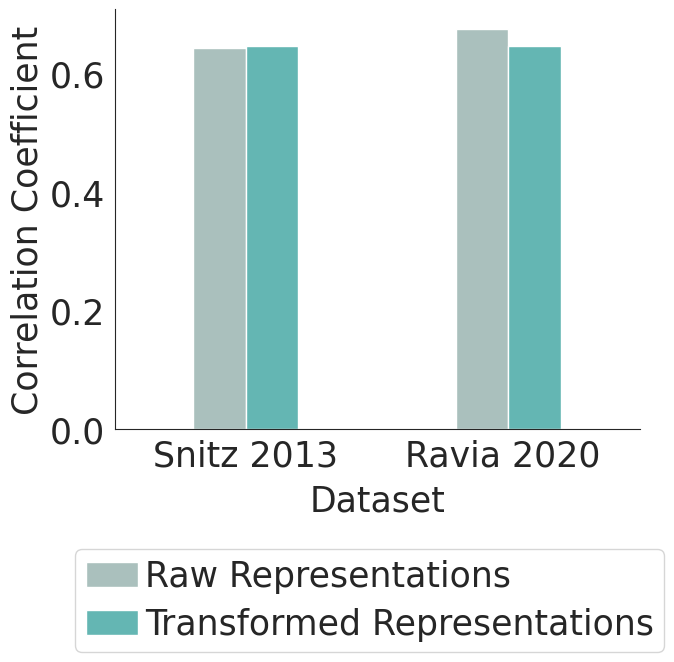

In [83]:
data={
    'row_1':  [ "Snitz 2013","Raw Representations",corr_last_snitz],'row_2':["Ravia 2020 ","Raw Representations" ,corr_last_ravia_similarity] ,
    # , "row_3": ["Keller 2016","Raw Representations",corr_last_keller],
    'row_4':  [ "Snitz 2013","Transformed Representations",corr_last_linear_snitz],'row_5':["Ravia 2020 ","Transformed Representations" ,corr_last_linear_ravia_similarity] ,
    # , "row_6": ["Keller 2016","Transformed Representations",corr_last_linear_keller]

     
     }
plot_bars(data,"perception","figs/realign_correlations.pdf")


In [84]:


def plot_lines(data,title,filename):
    df_corrs=pd.DataFrame.from_dict(data, orient='index',
                       columns=['Dataset', 'Correlation'])
    df_corrs=df_corrs.explode('Correlation')
    df_corrs['Layer'] = df_corrs.groupby(level=0).cumcount()
    #alternative
    #df['idx'] = df.groupby(df.index).cumcount()
    df_corrs = df_corrs.reset_index(drop=True)
    sns.set_style("white")
    # df[['0', '1','2', '3', '4', '5', '6', '7', '8', '9', '10', '11']] = df['All layers'].str.split(' ', expand=True)
    fig, ax = plt.subplots(figsize=(7.5, 7.5)
                           # ,constrained_layout = True
                          )
    
    
    # sns.color_palette("tab10")
    sns.color_palette("hls", 4)
    palette=[ "#56c4c0",
                "#f2c800",
                 # "#d73027",
                 # "#fc8d59",
                 # "#ffda33",
                
                # , "#4575b4"
    ]
    g=sns.lineplot(data=df_corrs, x="Layer", y="Correlation",hue="Dataset",palette = palette, lw=7)
    # sns.barplot(df_corrs, x="Dataset", y="Correlation", hue= "Correlation",width=0.2,legend=False,palette=sns.color_palette("Set2",4))
    
    
    ax.legend().set_title(title)
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
     # axes = plt.gca() #Getting the current axis
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #56c4c0fb
    
    fig.subplots_adjust(bottom=0.32,left=0.2)
    fig.legend(handles, labels, ncol=1, columnspacing=1, prop={'size': 25}, handlelength=1.5, loc="lower center",
               borderpad=0.3,
               bbox_to_anchor=(0.54, 0),
               
               frameon=True, labelspacing=0.4,handletextpad=0.2)
    g.set_xticks([0,2,4,6,8,10]) # <--- set the ticks first
    g.set_xticklabels(['1', '3', '5', '7', '9', '11'])
    
    # g.set_yticks([0.45,0.5,0.55,0.6,0.65,0.7]) # <--- set the ticks first
    # g.set_yticklabels(['', '0.5','', '0.6','', '0.7'])
    
    # g.set_yticks([0.45,0.5,0.55,0.6,0.65,0.7]) # <--- set the ticks first
    # g.set_yticklabels(['', '0.5','', '0.6','', '0.7'])
    # g.set_ylim(0.45,0.7)
    
    g.set_xlim(0,11)
    ax.set_ylabel('')
    ax.set_xlabel('Model Layer')
    # plt.margins(0,-0.16)
    ax.xaxis.set_label_coords(0.5, -0.13)
    
    # plt.tight_layout()
    plt.savefig(filename
                # , bbox_inches="tight"
               
               )


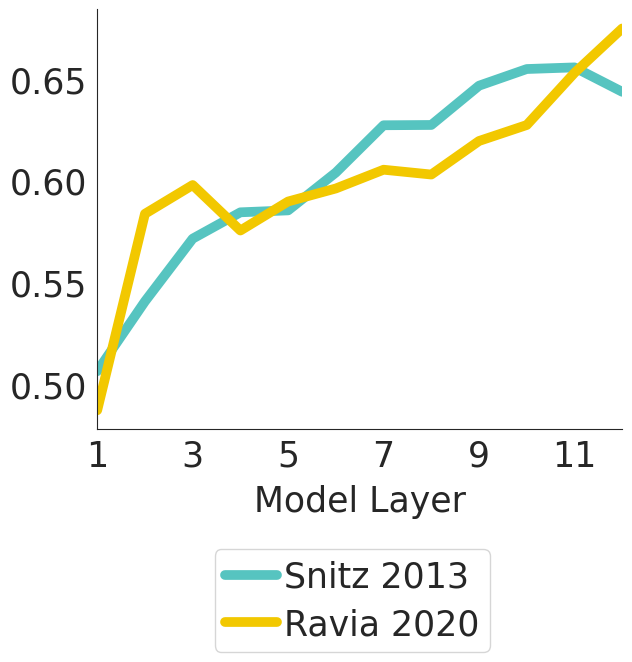

In [85]:
    
data={'row_1':  [ "Snitz 2013",corr_layers_snitz],'row_2':["Ravia 2020" ,corr_layers_ravia_similarity] 
     # , "row_4": ["Keller 2016",corr_layers_keller]
     }
plot_lines(data,"perception","figs/realign_layers.pdf")

### chemical correlations

In [86]:
chemical_features_r=["nCIR",
                             "ZM1", 
                             "GNar", 
                             "S1K", 
                             "piPC08",
                             "MATS1v",
                             "MATS7v",
                             "GATS1v", 
                             "Eig05_AEA(bo)", 
                             "SM02_AEA(bo)",
                             "SM03_AEA(dm)",
                             "SM10_AEA(dm)",
                             "SM13_AEA(dm)",
                              "SpMin3_Bh(v)",
                             "RDF035v",
                             "G1m",
                             "G1v",
                             "G1e",
                             "G3s",
                             "R8u+",
                             "nRCOSR"]
diff_nonStereoSMILE = list(map(lambda x: "diff-nonStereoSMILES___" + x, chemical_features_r))
diff_IsomericSMILES = list(map(lambda x: "diff-IsomericSMILES___" + x, chemical_features_r))
diffs= diff_nonStereoSMILE+diff_IsomericSMILES

0.1708225386786181 0.04824512751264857
0.09886871233906402 0.11542203802705056
0.15024594168621194 0.08720369087481593
-0.04353518819300493 0.11304649225193304
0.08934790286153327 0.11201383039923316
0.14010048607672565 0.03128203311259443
-0.014088900540892946 0.014369003757571358
-0.06078370836136802 -0.041255072437569984
0.0718854758634411 0.14337711356958885
0.06384351380086202 0.11966387053352588
0.0898621297426049 0.02882752791012612


/tmp/ipykernel_3197270/3604496935.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(7.5, 7.5)


0.09200504456718075 -0.006112729494393869
0.08259864852073716 0.06556954598259712
0.012776629556671073 0.0634165224205455


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


nan nan
nan nan


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


nan nan
nan nan


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzan

nan nan
nan nan
-0.0066358822755945655 -0.014053169053955886
0.1708225386786181 0.04824512751264857
0.09886871233906402 0.11542203802705056
0.15024594168621194 0.08720369087481593
-0.04353518819300493 0.11304649225193304
0.08934790286153327 0.11201383039923316
0.14010048607672565 0.03128203311259443
-0.014088900540892946 0.014369003757571358
-0.06078370836136802 -0.041255072437569984
0.0718854758634411 0.14337711356958885
0.06384351380086202 0.11966387053352588
0.0898621297426049 0.02882752791012612
0.09200504456718075 -0.006112729494393869
0.08259864852073716 0.06556954598259712
0.012776629556671073 0.0634165224205455


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


nan nan
nan nan


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


nan nan
nan nan


/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzantn/mambaforge/envs/Mol/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Midgard/home/farzan

nan nan
nan nan
-0.0066358822755945655 -0.014053169053955886


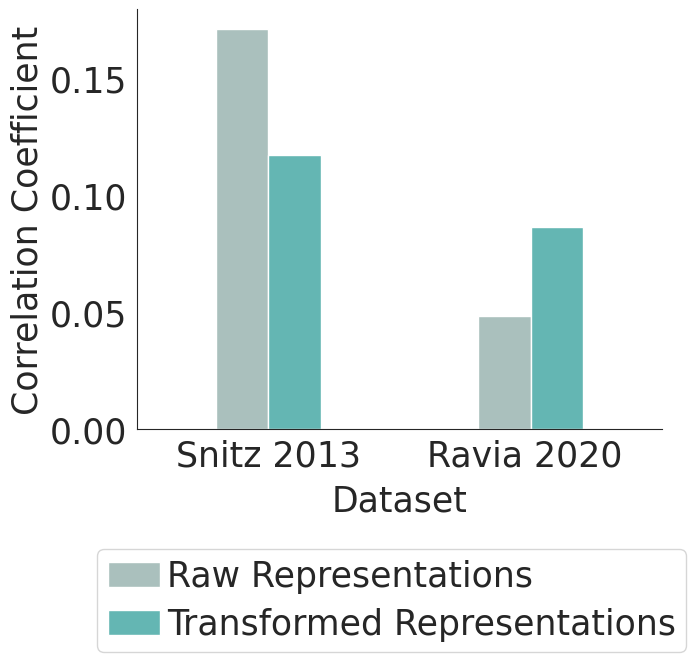

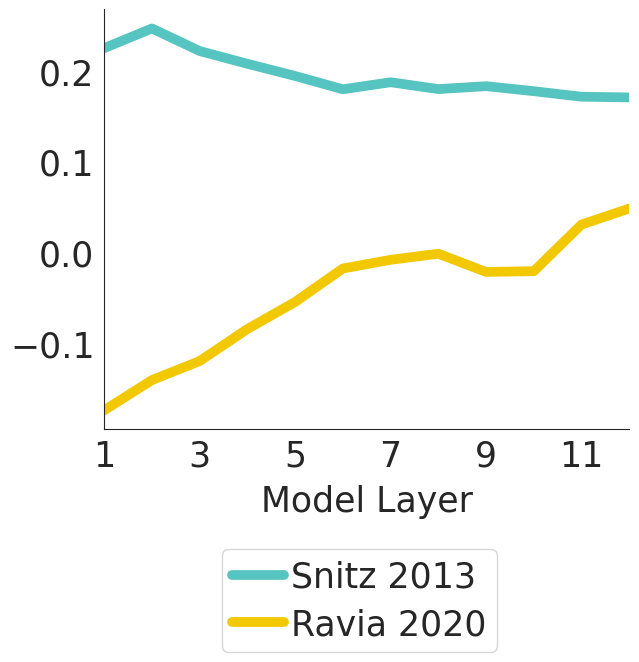

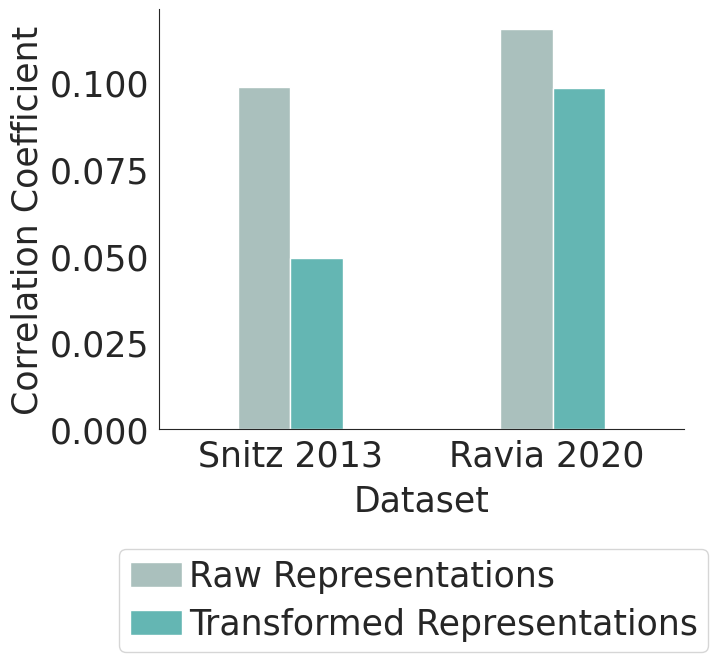

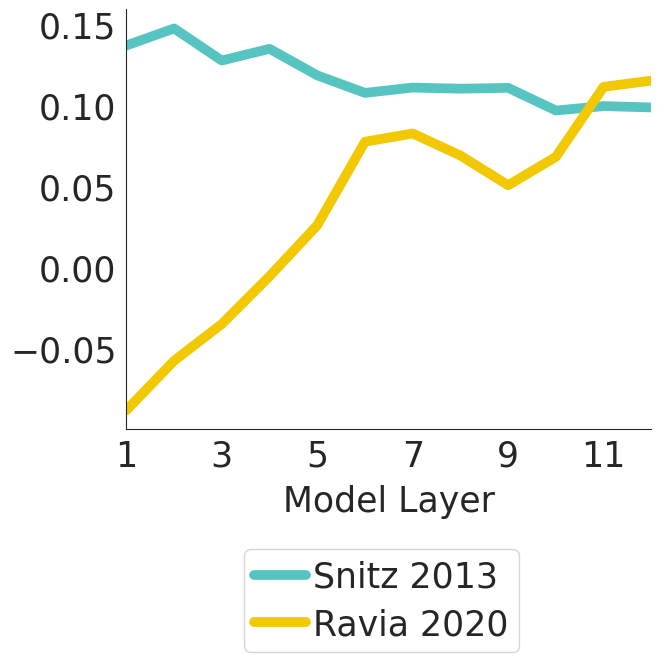

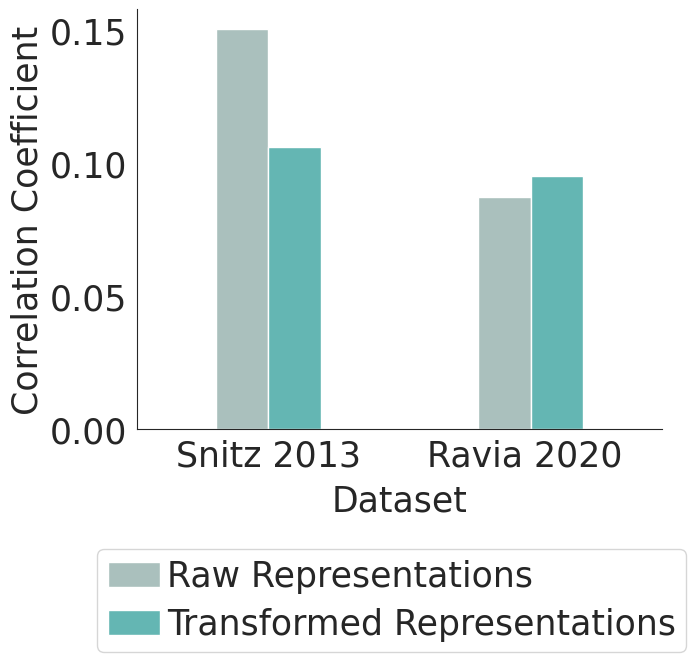

...

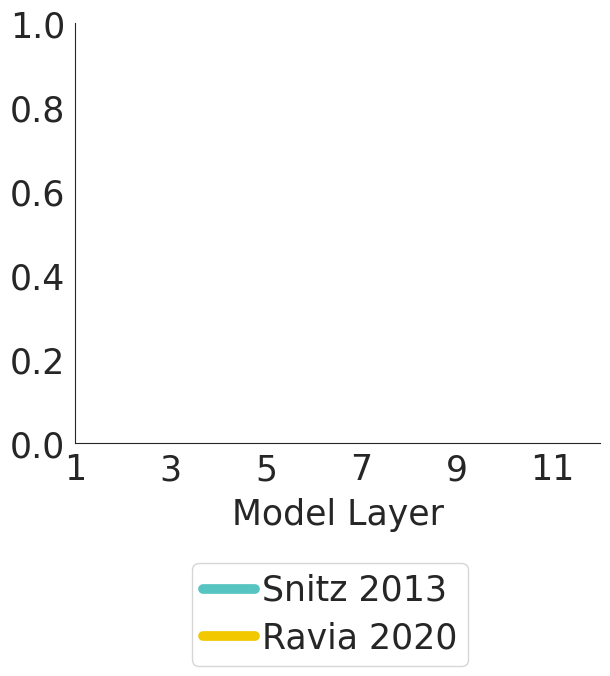

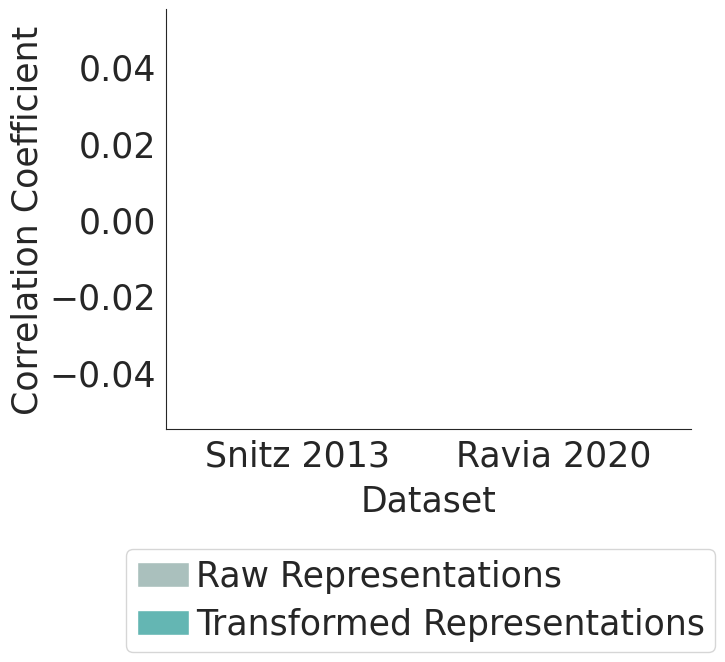

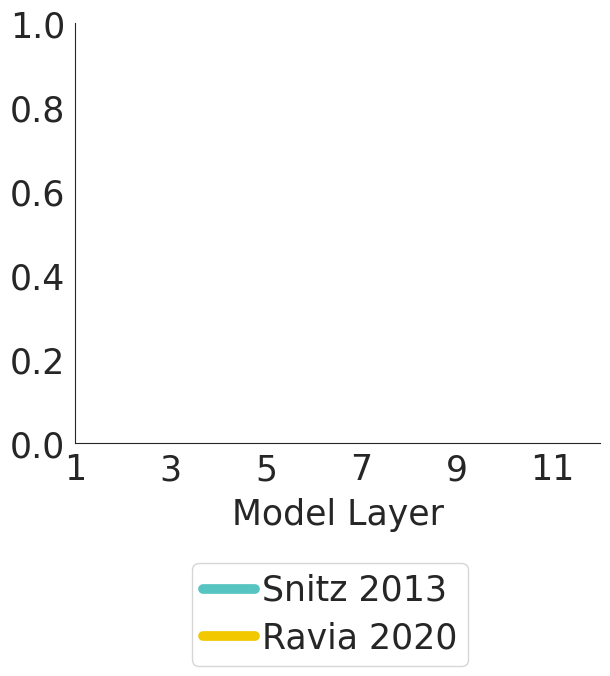

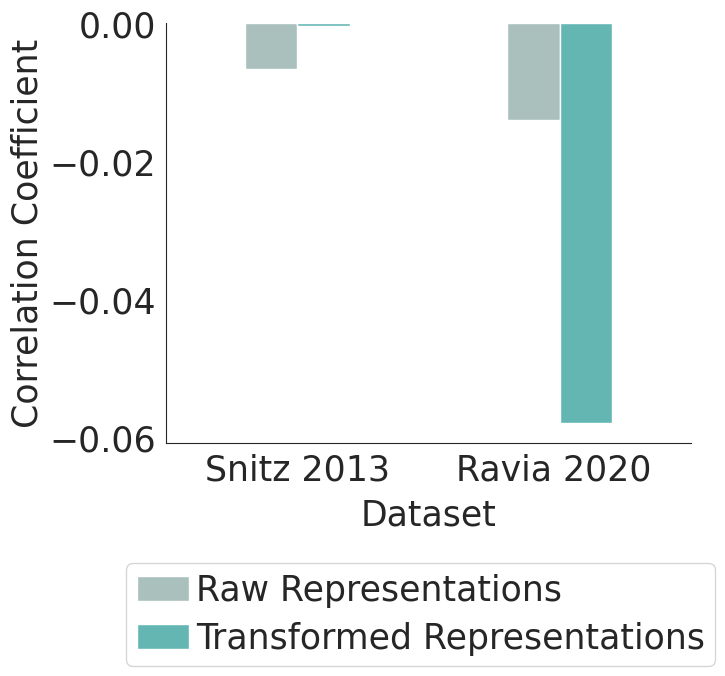

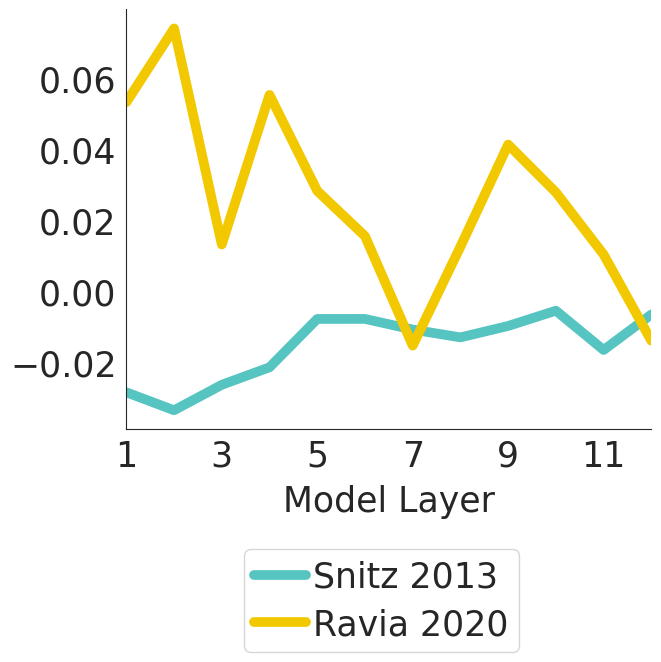

In [87]:


for diff in diffs:
    pivoted=pivot_helper(df_ravia_similarity_mean,diff)### Correlation with chemical features
    corr_last_ravia_similarity,corr_last_ravia_similarity_pvalue,corr_layers_ravia_similarity,corr_layers_ravia_similarity_pvalue=correlation_helper(pivoted,cosine_sim_df_ravia_similarity_mols_embeddings_zscored,cosine_sim_df_ravia_similarity_mols_layers_zscored,equalize_size=True)
    corr_last_linear_ravia_similarity,corr_last_linear_ravia_similarity_pvalue,corr_layers_ravia_similarity,corr_layers_ravia_similarity_pvalue=correlation_helper(pivoted,cosine_sim_df_ravia_similarity_mols_embeddings_linear_zscored,cosine_sim_df_ravia_similarity_mols_layers_zscored,equalize_size=True)
    
    
    pivoted=pivot_helper(df_snitz_mean,diff)### Correlation with chemical features
    corr_last_snitz,corr_last_snitz_pvalue,corr_layers_snitz,corr_layers_snitz_pvalue=correlation_helper(pivoted,cosine_sim_df_snitz_mols_embeddings_zscored,cosine_sim_df_snitz_mols_layers_zscored,equalize_size=True)
    corr_last_linear_snitz,corr_last_linear_snitz_pvalue,corr_layers_snitz,corr_layers_snitz_pvalue=correlation_helper(pivoted,cosine_sim_df_snitz_mols_embeddings_linear_zscored,cosine_sim_df_snitz_mols_layers_zscored,equalize_size=True)
    
    print(corr_last_snitz,corr_last_ravia_similarity)
    
    
    data={
        'row_1':  [ "Snitz 2013","Raw Representations",corr_last_snitz],'row_2':["Ravia 2020 ","Raw Representations" ,corr_last_ravia_similarity] ,
        # , "row_3": ["Keller 2016","Raw Representations",corr_last_keller],
        'row_4':  [ "Snitz 2013","Transformed Representations",corr_last_linear_snitz],'row_5':["Ravia 2020 ","Transformed Representations" ,corr_last_linear_ravia_similarity] ,
        # , "row_6": ["Keller 2016","Transformed Representations",corr_last_linear_keller]
    
         
         }
    plot_bars(data,diff,"figs/"+diff+"_correlations.pdf")
    data={'row_1':  [ "Snitz 2013",corr_layers_snitz],'row_2':["Ravia 2020" ,corr_layers_ravia_similarity] 
     # , "row_4": ["Keller 2016",corr_layers_keller]
         }
        
    plot_lines(data,diff,"figs/"+diff+"_layers_correlations.pdf")
        

### Data 

In [88]:
data

{'row_1': ['Snitz 2013',
  [-0.028579017439890532,
   -0.03363826554626956,
   -0.026459883075436296,
   -0.021531640794614355,
   -0.007908139786512893,
   -0.007900412157178904,
   -0.010899446733902926,
   -0.01310306948651694,
   -0.009882872760991092,
   -0.005578953624626146,
   -0.01665415910495544,
   -0.0066358822755945655]],
 'row_2': ['Ravia 2020',
  [0.05315067553123652,
   0.07393908449090789,
   0.013068988547822645,
   0.055211353101610336,
   0.02816928426706538,
   0.015424129455373324,
   -0.015416777544951524,
   0.012473834114111154,
   0.04121704791072358,
   0.02775650231318913,
   0.010243818349120387,
   -0.014053169053955886]]}

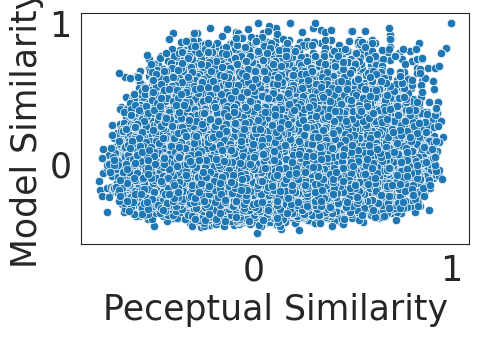

In [89]:

# ,,cosine_sim_df_keller_mols_layers_zscored

df_scattor_cor = flattening_data_helper(cosine_sim_df_keller_zscored,cosine_sim_df_keller_mols_embeddings_zscored,equalize_size=True)
# # data={'row_1':  [ "Snitz 2013",corr_layers_snitz],'row_2':["Ravia 2020" ,corr_layers_ravia_similarity], "row_4": ["Keller 2016",corr_layers_keller] }
# df_corrs=pd.DataFrame.from_dict(data, orient='index',
#                        columns=['Dataset', 'Correlation'])
# df_corrs=df_corrs.explode('Correlation')
# df_corrs['Layer'] = df_corrs.groupby(level=0).cumcount()
# #alternative
# #df['idx'] = df.groupby(df.index).cumcount()
# df_corrs = df_corrs.reset_index(drop=True)
# df[['0', '1','2', '3', '4', '5', '6', '7', '8', '9', '10', '11']] = df['All layers'].str.split(' ', expand=True)
fig, ax = plt.subplots(figsize=(5, 3))
sns.set_style("whitegrid")
# sns.color_palette("tab10")
sns.color_palette("hls", 4)
sns.scatterplot(data=df_scattor_cor, x="Peceptual Similarity", y="Model Similarity")
# sns.barplot(df_corrs, x="Dataset", y="Correlation", hue= "Correlation",width=0.2,legend=False,palette=sns.color_palette("Set2",4))
for i in ax.containers:
    ax.bar_label(i,)

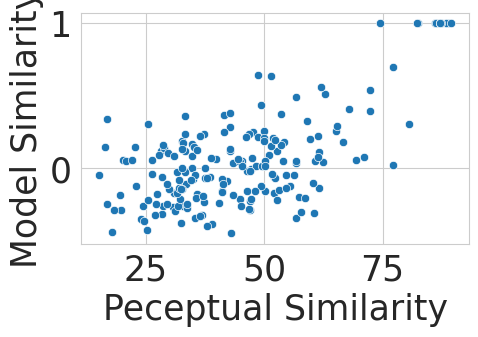

In [90]:
df_scattor_cor = flattening_data_helper(df_ravia_similarity_mean_pivoted,cosine_sim_df_ravia_similarity_mols_embeddings_zscored,equalize_size=True)
fig, ax = plt.subplots(figsize=(5, 3))
sns.set_style("whitegrid")
# sns.color_palette("tab10")
sns.color_palette("hls", 4)
sns.scatterplot(data=df_scattor_cor, x="Peceptual Similarity", y="Model Similarity")
# sns.barplot(df_corrs, x="Dataset", y="Correlation", hue= "Correlation",width=0.2,legend=False,palette=sns.color_palette("Set2",4))
for i in ax.containers:
    ax.bar_label(i,)

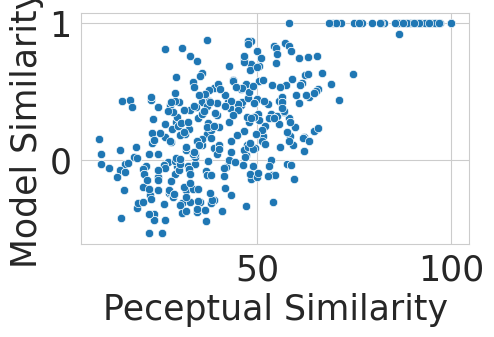

In [91]:
df_scattor_cor = flattening_data_helper(df_snitz_mean_pivoted,cosine_sim_df_snitz_mols_embeddings_zscored)
fig, ax = plt.subplots(figsize=(5, 3))
sns.set_style("whitegrid")
# sns.color_palette("tab10")
sns.color_palette("hls", 4)
sns.scatterplot(data=df_scattor_cor, x="Peceptual Similarity", y="Model Similarity")
# sns.barplot(df_corrs, x="Dataset", y="Correlation", hue= "Correlation",width=0.2,legend=False,palette=sns.color_palette("Set2",4))
for i in ax.containers:
    ax.bar_label(i,)

## Chemical Discovery

In [92]:
df_snitz_mols_alva = pd.read_csv('/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_ravia2020_alvaa.csv')

In [93]:
df_snitz_mols_alva.head(5)

,CID Stimulus 1,CID Stimulus 2,RatedSimilarity,Stimulus 1-IsomericSMILES,Stimulus 2-IsomericSMILES,Stimulus 1-IsomericSMILES_sep,Stimulus 2-IsomericSMILES_sep,Stimulus 1-nonStereoSMILES,Stimulus 2-nonStereoSMILES,Stimulus 1-nonStereoSMILES_sep,...,Stimulus 1-nonStereoSMILES___s34_relSize,Stimulus 2-nonStereoSMILES___s34_relSize,Stimulus 1-nonStereoSMILES___s34_phSize,Stimulus 2-nonStereoSMILES___s34_phSize,Stimulus 1-nonStereoSMILES___s34_phRelSize,Stimulus 2-nonStereoSMILES___s34_phRelSize,Stimulus 1-nonStereoSMILES___chiralMoment,Stimulus 2-nonStereoSMILES___chiralMoment,Stimulus 1-nonStereoSMILES___chiralPhMoment,Stimulus 2-nonStereoSMILES___chiralPhMoment
0,326;26331;1140;11002,326;26331;1140;11002,89.136364,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,"CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...","CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...",CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,"CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1,CCc1cnccn...",...,"0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0"
1,326;26331;1140;11002,7410;240;93009;8635,28.045455,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,CC(=O)C1=CC=CC=C1CC(=O)C1=CC=CC=C1C1=CC=C(C=C1...,"CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...","CC(=O)C1=CC=CC=C1CC(=O)C1=CC=CC=C1,C1=CC=C(C=C...",CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,CC(=O)c1ccccc1CC(=O)c1ccccc1O=Cc1ccccc1O=Cc1cc...,"CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1,CCc1cnccn...",...,"0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.75, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 2.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.142857, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 8.88484, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 3.464102, 0.0"
2,326;26331;1140;11002,6544;62433;7519;7685;3314,38.477273,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,CC1=CC(=O)CC(C1)(C)CCC1=CC(=O)CC(C1)(C)CCCCCCO...,"CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...","CC1=CC(=O)CC(C1)(C)CCC1=CC(=O)CC(C1)(C)C,CCCCC...",CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,CC1=CC(=O)CC(C)(C)C1CC1=CC(=O)CC(C)(C)C1CCCCCO...,"CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1,CCc1cnccn...",...,"0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.0"
3,326;26331;1140;11002,31276;8148;7762;18827;7714,22.090909,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,CC(C)CCOC(=O)CCC(C)CCOC(=O)CCCCCNCCCCCCCCNCCCC...,"CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...","CC(C)CCOC(=O)CCC(C)CCOC(=O)C,CCCCNCCCCCCCCNCCC...",CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,CC(=O)OCCC(C)CCC(=O)OCCC(C)CCCCCNCCCCCCCCNCCCC...,"CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1,CCc1cnccn...",...,"0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.777778, 0.769231","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 2.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.153846","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 7.483315, 10.198039","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 1.732051, 3.464102"
4,326;26331;1140;11002,7519;8148;31252;8103;7710;11002,59.045455,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,COC1=CC=CC=C1COC1=CC=CC=C1CCCCNCCCCCCCCNCCCCCC...,"CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=O,CCC...","COC1=CC=CC=C1COC1=CC=CC=C1,CCCCNCCCCCCCCNCCCC,...",CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,COc1ccccc1COc1ccccc1CCCCNCCCCCCCCNCCCCCc1cnc(C...,"CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1,CCc1cnccn...",...,"0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.727273, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 2.0, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 0.181818, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 7.211103, 0.0","0.0, 0.0, 0.0, 0.0","0.0, 0.0, 0.0, 0.0, 3.464102, 0.0"


In [94]:
chemical_features_r=["nCIR", "ZM1", "GNar", "S1K", "piPC08", "MATS1v", "MATS7v","GATS1v", "Eig05_AEA(bo)", "SM02_AEA(bo)","SM03_AEA(dm)","SM10_AEA(dm)","SM13_AEA(dm)",
                  "SpMin3_Bh(v)", "RDF035v","G1m","G1v","G1e","G3s","R8u+","nRCOSR"
                  ]
len(chemical_features_r)

21

In [95]:
features = ["AMW", "s1_numAroBonds"]
types = ["nonStereoSMILES___", "nonStereoSMILES" ]

### Save Molecules

In [96]:
df_ravia_similarity_mols


,IsomericSMILES,nonStereoSMILES,CID
0,C1=CC(=CC=C1C=O)OC1=CC(=CC=C1C=O)OCCCCCCCCCC1C...,O=Cc1ccc(O)cc1O=Cc1ccc(O)cc1CCCCCCCCCC1CCCC(=O...,126;520296;7122;6050;5273467;5364231
1,CCOC(=O)/C=C/C=C/CCCOC(=O)/C=C/C=C/CCC(C)COC(=...,CC=CC=CC(=O)OCCCC=CC=CC(=O)OCCCC(C)COC(=O)C=Cc...,1550470;778574;11980;61771;6998;444972;14104;3...
2,CC(=O)C1=CC(=C(C=C1)O)OCCC(=O)C1=CC(=C(C=C1)O)...,COc1cc(C(C)=O)ccc1OCOc1cc(C(C)=O)ccc1OCCOC(=O)...,2214;556940;8180;8077;325;11086
3,C1=CC=C(C=C1)C=OC1=CC=C(C=C1)C=OCC1(C2CCC(O1)(...,O=Cc1ccccc1O=Cc1ccccc1CC12CCC(CC1)C(C)(C)O2CC1...,240;2758;8130;8129;7710;7059;4133;8918;957;6654
4,C1=CC=C(C=C1)C=OC1=CC=C(C=C1)C=OC1=CC=C(C=C1)/...,O=Cc1ccccc1O=Cc1ccccc1O=CC=Cc1ccccc1O=CC=Cc1cc...,240;637511;7731;2758;12178;62336;8635
5,CC(C)CCOC(=O)CCC(C)CCOC(=O)CCCCCCOC(=O)CCCCCCC...,CC(=O)OCCC(C)CCC(=O)OCCC(C)CCCCCCOC(=O)CCCCCCC...,31276;62433;8129;12178;7519;18827;10722
6,CC(C)CCOC(=O)CCC(C)CCOC(=O)CCCCCNCCCCCCCCNCCCC...,CC(=O)OCCC(C)CCC(=O)OCCC(C)CCCCCNCCCCCCCCNCCCC...,31276;8148;7762;18827;7714
7,CC(C)C1=CC=C(C=C1)C=OCC(C)C1=CC=C(C=C1)C=OCCC1...,CC(C)c1ccc(C=O)cc1CC(C)c1ccc(C=O)cc1CCc1cnccn1...,326;26331;1140;11002
8,CCC/C=C/C=OCCC/C=C/C=OC1=CC=C(C=C1)/C=C/C=OC1=...,CCCC=CC=OCCCC=CC=OO=CC=Cc1ccccc1O=CC=Cc1ccccc1...,5281168;637511;7685;12178;4133;7991;6054;7770;...
9,CCCCCC/C=C/C(=O)CCCCCCC/C=C/C(=O)CCC(C)CCSCC(C...,CCCCCCC=CC(C)=OCCCCCCC=CC(C)=OCC(C)CCSCC(C)CCS...,5363233;10925;5365049;6050;5273467;31219;7765;...


In [97]:
df_snitz_mols

,IsomericSMILES,nonStereoSMILES,CID
0,CC(C)CC(=O)O,CC(C)CC(=O)O,10430
1,CC1=CC=CC=C1C=O,Cc1ccccc1C=O,10722
2,C#CC1=CC=CC=C1,C#Cc1ccccc1,10821
3,CCCCCOC(=O)CCCCOC1=CC=CC=C1C1=CC=C2C(=C1)C=CC(...,CCCCCOC(=O)CCCCOc1ccccc1O=c1ccc2ccccc2o1c1ccc(...,"10890,7519,323,7583,7762,26331,8892,7888,44315..."
4,CCCCCOC(=O)CCCCC(=O)O[C@@H]1C[C@@H]2CC[C@]1(C2...,CCCCCOC(=O)CCCCC(=O)OC1CC2CCC1(C)C2(C)CCCCCSCC...,"10890,93009,11002,6982,323,8797,7966,8148,7632..."
...,...,...,...
101,CCCCCCCCCOC(=O)C,CCCCCCCCCOC(C)=O,8918
102,CC(=O)O[C@@H]1C[C@@H]2CC[C@]1(C2(C)C)C,CC(=O)OC1CC2CCC1(C)C2(C)C,93009
103,CC(=O)O[C@@H]1C[C@@H]2CC[C@]1(C2(C)C)CCOC1=CC=...,CC(=O)OC1CC2CCC1(C)C2(C)CCOc1ccccc1OC=CC(C)(O)...,"93009,460,443158,6544"
104,CCCCCCCCO,CCCCCCCCO,957


### Train OpenPOM using GS-LF dataset

### Apply POM on ds1

### Apply POM on ds2

### Apply POM on ds3

### Freche Distance

#### pre-proce to compute freche

In [98]:
# df_human_dist=df.replace(-1000.0, np.NaN)
# df_human_dist['Combined'] = df_human_dist.loc[:, 'Acid':'Wood'].values.tolist()
# df_cleaned = df_human_dist.dropna(subset=['Combined'])
# df_cleaned=df_cleaned.reset_index()
# cid_combined = df_cleaned[['CID', 'Combined','Replicate']]
# cid_combined = cid_combined[cid_combined['Replicate']==0]
# cid_combined

In [99]:
cid1s=[]
cid2s=[]
frs = []
unique_cids = cid_combined.CID.unique()
combined_data = cid_combined.set_index('CID')['Combined']

for cid1, cid2 in itertools.combinations(unique_cids,2):
    list1 = combined_data[cid1].tolist()
    list2 = combined_data[cid2].tolist()

    cid1s.append(cid1)
    cid2s.append(cid2)

    fr = frdist(list1, list2)
    frs.append(fr)

# Convert lists to NumPy arrays for further operations if needed
cid1s = np.array(cid1s)
cid2s = np.array(cid2s)
frs = np.array(frs)
dict = {'cid1':cid1s, 'cid2s': cid2s, 'frs': frs} 
    
df_frs = pd.DataFrame(dict)

NameError: name 'cid_combined' is not defined

In [ ]:
# cid1s=[]
# cid2s=[]
# frs = []
# unique_cids = cid_combined.CID.unique()
# combined_data = cid_combined.set_index('CID')['Combined']

# for cid1 in [126,16220109]:
#     for cid2 in unique_cids:
#     # combined_data
#         list1 = combined_data[cid1].tolist()
#         list2 = combined_data[cid2].tolist()
    
#         cid1s.append(cid1)
#         cid2s.append(cid2)
    
#         fr = frdist(list1, list2)
#         frs.append(fr)

# # Convert lists to NumPy arrays for further operations if needed
# cid1s = np.array(cid1s)
# cid2s = np.array(cid2s)
# frs = np.array(frs)
# dict = {'cid1':cid1s, 'cid2s': cid2s, 'frs': frs} 
    
# df_frs2 = pd.DataFrame(dict)

df_human

In [ ]:

# input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/keller_2016_fereche_distances.csv'

# df_frs=pd.read_csv(input_file)
# df_frs
# df_frs.set_index(['cid1'])
# df_frs.head()
# df_frs.head(20).to_dict()
# df_frs=df_frs.drop(["Unnamed: 0"], axis=1).reset_index(drop=True)
# df_frs_mirrored = df_frs.copy()
# df_frs_mirrored.columns = ["cid2s","cid1","frs"]
# for cid in df_keller_human.CID.unique():
#     new_row = {'cid1':cid, 'cid2s': cid , "frs":0}
#     df_frs_mirrored = pd.concat([df_frs_mirrored, pd.DataFrame([new_row])],  ignore_index=True)

# df_frs_all = pd.concat([df_frs, df_frs_mirrored], axis=0)

## Embedding of Molformer and a linear Classifier for Molecules

In [ ]:
cosine_sim_df_snitz2013_molecules_embeddings=cosine_similarity_df(df_snitz_mols_embeddings,'Combined')

### Training Linear Model with the embedding of Leffingweel and GoodScent dataset extracted from Mol

#### Preparing Dataset

In [ ]:
leffingwell_goodscent_TASKS = [
'alcoholic', 'aldehydic', 'alliaceous', 'almond', 'amber', 'animal',
'anisic', 'apple', 'apricot', 'aromatic', 'balsamic', 'banana', 'beefy',
'bergamot', 'berry', 'bitter', 'black currant', 'brandy', 'burnt',
'buttery', 'cabbage', 'camphoreous', 'caramellic', 'cedar', 'celery',
'chamomile', 'cheesy', 'cherry', 'chocolate', 'cinnamon', 'citrus', 'clean',
'clove', 'cocoa', 'coconut', 'coffee', 'cognac', 'cooked', 'cooling',
'cortex', 'coumarinic', 'creamy', 'cucumber', 'dairy', 'dry', 'earthy',
'ethereal', 'fatty', 'fermented', 'fishy', 'floral', 'fresh', 'fruit skin',
'fruity', 'garlic', 'gassy', 'geranium', 'grape', 'grapefruit', 'grassy',
'green', 'hawthorn', 'hay', 'hazelnut', 'herbal', 'honey', 'hyacinth',
'jasmin', 'juicy', 'ketonic', 'lactonic', 'lavender', 'leafy', 'leathery',
'lemon', 'lily', 'malty', 'meaty', 'medicinal', 'melon', 'metallic',
'milky', 'mint', 'muguet', 'mushroom', 'musk', 'musty', 'natural', 'nutty',
'odorless', 'oily', 'onion', 'orange', 'orangeflower', 'orris', 'ozone',
'peach', 'pear', 'phenolic', 'pine', 'pineapple', 'plum', 'popcorn',
'potato', 'powdery', 'pungent', 'radish', 'raspberry', 'ripe', 'roasted',
'rose', 'rummy', 'sandalwood', 'savory', 'sharp', 'smoky', 'soapy',
'solvent', 'sour', 'spicy', 'strawberry', 'sulfurous', 'sweaty', 'sweet',
'tea', 'terpenic', 'tobacco', 'tomato', 'tropical', 'vanilla', 'vegetable',
'vetiver', 'violet', 'warm', 'waxy', 'weedy', 'winey', 'woody'
]

In [ ]:
input_file = '/local_storage/datasets/farzaneh/openpom/data/curated_datasets/curated_GS_LF_merged_4983.csv' # or new downloaded file path
featurizer = dc.feat.DummyFeaturizer()
smiles_field = 'nonStereoSMILES'
randomstratifiedsplitter = dc.splits.RandomStratifiedSplitter()
loader = dc.data.CSVLoader(tasks=leffingwell_goodscent_TASKS,
                   feature_field=smiles_field,
                   featurizer=featurizer
                          )
dataset = loader.create_dataset(inputs=[input_file])
n_tasks = len(dataset.tasks)
train_dataset, test_dataset, valid_dataset = randomstratifiedsplitter.train_valid_test_split(dataset, frac_train = 0.8, frac_valid = 0.1, frac_test = 0.1, seed = 1)

#### Extracting embeddings Leffingweel+GoodScent from Molformer

In [ ]:
# activation = {}
train_embeddings_original, train_activations_embeddings_original=embed(lm, train_dataset.X, tokenizer, batch_size=64)
test_embeddings_original, test_activations_embeddings_original=embed(lm,test_dataset.X, tokenizer, batch_size=64)
train_embeddings_original = torch.cat(train_embeddings_original).numpy()
test_embeddings_original = torch.cat(test_embeddings_original).numpy()

In [ ]:
y_train=torch.from_numpy(train_dataset.y)
y_test=torch.from_numpy(test_dataset.y)

#### Preparing embeddings

In [ ]:
embedding_train_dataset = dc.data.DiskDataset.from_numpy(train_embeddings_original.tolist(),y_train.tolist())
embedding_test_dataset = dc.data.DiskDataset.from_numpy(test_embeddings_original.tolist(),y_test.tolist())

In [ ]:
model = LinearModel().to(device_name)
model.n_tasks=n_tasks
model.n_classes=1
nb_epoch = 200
learning_rate = 0.001
class_imbalance_ratio = get_class_imbalance_ratio(train_dataset)
if class_imbalance_ratio and (len(class_imbalance_ratio) != n_tasks):
            raise Exception("size of class_imbalance_ratio \
                            should be equal to n_tasks")

In [ ]:

modeldeepchem = LinearModelMultiLabelDeepchem(model=model,class_imbalance_ratio=class_imbalance_ratio,loss_aggr_type='sum',device_name=device_name,mode="classification",optimizer_name = 'adam',learning_rate=learning_rate,batch_size=128)
metric = dc.metrics.Metric(dc.metrics.roc_auc_score)
start_time = datetime.now()
for epoch in range(1, nb_epoch+1):
        loss = modeldeepchem.fit(
              embedding_train_dataset,
              nb_epoch=1,
              max_checkpoints_to_keep=1,
              deterministic=False,
              restore=epoch>1)
        train_scores = modeldeepchem.evaluate(embedding_train_dataset, [metric])['roc_auc_score']
        valid_scores = modeldeepchem.evaluate(embedding_test_dataset, [metric])['roc_auc_score']
        # print(f"epoch {epoch}/{nb_epoch} ; loss = {loss}; train_scores = {train_scores}; valid_scores = {valid_scores}")
modeldeepchem.save_checkpoint()
end_time = datetime.now()

 Now we have a linear layer trained on top of the Mol. Now we feed molecules to Molformer and then to this model to get embeddings. We'll do this on the molecules that are availble in the dataset and those that are not separately

### Keller2016

In [ ]:
# activation = {}
# embed(lm,molecules_Ravia1, tokenizer, batch_size=64)
keller_embeddings_original, keller_activation_embeddings_original=embed(lm,df_keller_uniqueMols['IsomericSMILES'], tokenizer, batch_size=64)


In [ ]:
keller_embeddings_original = torch.cat(keller_embeddings_original).numpy()
#y_train needs to be fixed
keller_embeddings_original = dc.data.DiskDataset.from_numpy(keller_embeddings_original.tolist(),y_train.tolist())


#### Preparing embeddings

In [ ]:
keller_embeddings_molformer_linear=modeldeepchem.predict_embedding(keller_embeddings_original)

In [ ]:
df_keller_embeddings_molformer_linear = pd.DataFrame(keller_embeddings_molformer_linear, index=df_keller_uniqueMols['CID'])
df_keller_embeddings_molformer_linear['Combined'] = df_keller_embeddings_molformer_linear.loc[:, '0':'256'].values.tolist()

In [ ]:
df_keller_embeddings_molformer_linear = df_keller_embeddings_molformer_linear.dropna(subset=['Combined'])
df_keller_embeddings_molformer_linear=df_keller_embeddings_molformer_linear.reset_index()
df_keller_embeddings_molformer_linear = df_keller_embeddings_molformer_linear[['CID', 'Combined']]
vector_df_keller_embeddings_molformer_linear = df_keller_embeddings_molformer_linear['Combined'].to_list()
cosine_sim_matrix_keller_embeddings_molformer_linear = cosine_similarity(vector_df_keller_embeddings_molformer_linear)
cosine_sim_matrix_keller_embeddings_molformer_linear = pd.DataFrame(cosine_sim_matrix_keller_embeddings_molformer_linear, index=df_keller_embeddings_molformer_linear['CID'], columns=df_keller_embeddings_molformer_linear['CID'])